# Подключаем нужные библиотеки

In [1]:
import numpy as np
from numpy.linalg import norm
import pickle
import matplotlib.pyplot as plt
import itertools
from scipy.stats import norm as norm_d
from scipy.stats import randint
from scipy.stats import uniform
from scipy.optimize import minimize
import copy
import math
import time
from scipy.optimize import minimize
from scipy.sparse.linalg import svds
from pathlib import Path
from scipy.linalg import svdvals
import scipy
from sklearn.datasets import load_svmlight_file
import pickle
from functions import *
from algorithms import *
from tests import *

%matplotlib inline
%load_ext autoreload
%autoreload 2

In [2]:
!wget https://www.csie.ntu.edu.tw/~cjlin/libsvmtools/datasets/binary/gisette_scale.bz2

--2023-04-27 15:27:38--  https://www.csie.ntu.edu.tw/~cjlin/libsvmtools/datasets/binary/gisette_scale.bz2
Распознаётся www.csie.ntu.edu.tw (www.csie.ntu.edu.tw)… 140.112.30.26
Подключение к www.csie.ntu.edu.tw (www.csie.ntu.edu.tw)|140.112.30.26|:443... соединение установлено.
HTTP-запрос отправлен. Ожидание ответа… 200 OK
Длина: 21902461 (21M) [application/x-bzip2]
Сохранение в: ‘gisette_scale.bz2’

gisette_scale.bz2   100%[===================>]  20,89M  45,4KB/s    за 11m 20s 

2023-04-27 15:39:00 (31,5 KB/s) - ‘gisette_scale.bz2’ сохранён [21902461/21902461]



# Логистическая регрессия

Для удобства продублируем здесь задачу, которую мы решаем
$$
F(x) = f(x) + R(x) = \frac{1}{m}\sum\limits_{i=1}^m\underbrace{\left(\log\left(1 + \exp\left(-y_i\cdot (Ax)_i\right)\right) + \frac{l_2}{2}\|x\|_2^2\right)}_{f_i(x)} + \underbrace{l_1\|x\|_1}_{R(x)} \to \min\limits_{x\in\mathbb{R}^n}
$$

### Объединим подготовку данных в одну функцию

In [9]:
def prepare_data(dataset):
    if dataset != "gisette_scale.bz2":
        filename = "datasets/" + dataset + ".txt"
    else:
        filename = "datasets/" + dataset
    data = load_svmlight_file(filename)
    A, y = data[0], data[1]
    m, n = A.shape
    
    if (2 in y) & (1 in y):
        y = 2 * y - 3
    if (2 in y) & (4 in y):
        y = y - 3
    assert((-1 in y) & (1 in y))
    
    sparsity_A = A.count_nonzero() / (m * n)
    return A, y, m, n, sparsity_A

In [10]:
def compute_L(dataset, A):
    filename = "dump/"+dataset+"_L.txt"
    file_path = Path(filename)
    if file_path.is_file():
        with open(filename, 'rb') as file:
            L, average_L, worst_L = pickle.load(file)
    else:
        sigmas = svds(A, return_singular_vectors=False)
        m = A.shape[0]
        L = sigmas.max()**2 / (4*m)
        
        worst_L = 0
        average_L = 0
        denseA = A.toarray()
        for i in range(m):
            L_temp = (norm(denseA[i])**2)*1.0 / 4
            average_L += L_temp / m
            if L_temp > worst_L:
                worst_L = L_temp
        with open(filename, 'wb') as file:
            pickle.dump([L, average_L, worst_L],file)
    return L, average_L, worst_L

In [11]:
# /home/slava/Рабочий стол/experements/made_opt_in_ml/homework_3/dump/a5a_L.txt
filename = "dump/gisette_scale.bz2_L.txt"
with open(filename, 'rb') as file:
    L, average_L, worst_L = pickle.load(file)
L

842.8680386162079

## Задание 1. Разреженность матрицы

Рассмотрите датасеты $\texttt{a9a}$, $\texttt{gisette}$, $\texttt{australian}$ и ещё любых 2 датасета на ваш вкус из LIBSVM https://www.csie.ntu.edu.tw/~cjlin/libsvmtools/datasets/binary.html. Для каждого выбранного датасета проанализируйте какой тип матрицы лучше использовать -- $\texttt{csr\_matrix}$ или $\texttt{numpy.ndarray}$ -- чтобы вычислять для данного датасета 

1) полный градиент и

2) стох. градиент (рассмотреть батчи размера 1, 10, 100).

Как видно из формулы для подсчёта градиента 
$$
\nabla f(x) = -\frac{1}{m}\cdot\frac{A^\top y}{1+\exp(y\odot Ax)}  + l_2 x,
$$
и стох. градиента по батчу $S = \{i_1,i_2,\ldots,i_k\}$
$$
\frac{1}{k}\sum\limits_{j=1}^k \nabla f_{i_j}(x) = -\frac{1}{k}\cdot\frac{A_S^\top y_S}{1+\exp(y_S\odot A_Sx)}  + l_2 x,
$$
необходимо выполнить умножение $A^\top$ (или $A_S^\top$) на вектор и умножение $A$ (или $A_S$) на вектор, чтобы посчитать градиент (стох. градиент). Поэтому анализировать предлагается следующим способом: генерируется 5 случайных векторов размерности $n$, а затем в цикле много раз вычисляются градиенты (стох. градиенты) в указанных точках. Количество подсчётов градиентов выбирайте исходя из того, чтобы все умножения при одном из типов хранения матрицы $A$ занимали от 10 до 40 секунд. Для подсчёта стох. градиентов заранее насэмплируйте при помощи функции $\texttt{randint}$ большую выборку элементов от $0$ до $m-1$ (например, выборку размера $10^7$ элементов), а затем вырезайте из неё подряд идущие непересекающиеся куски длиной $r$, где $r$ -- размер батча. Для удобства считайте, что $l_2 = 0$

In [5]:
%%time
dataset = "a9a"
A, y, m, n, sparsity_A = prepare_data(dataset)
print("Число функций в сумме: ", m, ", размерность задачи: ", n)
L, average_L, worst_L = compute_L(dataset, A) #L может зависеть от запуска, поэтому для каждой задачи нужно сохранить свою константу L
print("Константа гладкости всей функции: ", L)
print("Средняя константа гладкости     : ", average_L)
print("Худшая константа гладкости      : ", worst_L)
print("Доля ненулевых элементов: ", sparsity_A)

Число функций в сумме:  32561 , размерность задачи:  123
Константа гладкости всей функции:  1.5719196992226612
Средняя константа гладкости     :  3.467276803535652
Худшая константа гладкости      :  3.5
Доля ненулевых элементов:  0.11275696922074716
CPU times: user 228 ms, sys: 4.95 ms, total: 233 ms
Wall time: 232 ms


По умолчанию матрица $A$ хранится в формате $\texttt{csr\_matrix}$

In [6]:
denseA = A.toarray()
print(type(A))
print(type(denseA))

<class 'scipy.sparse._csr.csr_matrix'>
<class 'numpy.ndarray'>


Насэмплируем индексов для батчей

In [25]:
%%time
batch_indices = randint.rvs(low=0, high=m, size=10000000, random_state=None)

CPU times: user 172 ms, sys: 80 ms, total: 252 ms
Wall time: 248 ms


Пример того, как выглядят тесты для полноградиентного случая

In [26]:
%%time
x = norm_d.rvs(size=n)

CPU times: user 1.33 ms, sys: 0 ns, total: 1.33 ms
Wall time: 1.23 ms


In [27]:
num_of_tests = 600

In [28]:
%%time
for j in range(5):
    x = norm_d.rvs(size=n)
    for i in range(num_of_tests):
        logreg_grad(x, [A, y, 0, True])

CPU times: user 16.7 s, sys: 5 µs, total: 16.7 s
Wall time: 16.7 s


In [29]:
%%time
for j in range(5):
    x = norm_d.rvs(size=n)
    for i in range(num_of_tests):
        logreg_grad(x, [denseA, y, 0, False])

CPU times: user 3min 58s, sys: 1min 51s, total: 5min 49s
Wall time: 52.3 s


Пример тестов для случая стох. градиентов

In [30]:
batch_size = 1
num_of_tests = 10000

In [31]:
%%time
for j in range(5):
    x = norm_d.rvs(size=n)
    for i in range(num_of_tests):
        batch_ind = batch_indices[i*batch_size:(i+1)*batch_size]
        logreg_grad(x, [A[batch_ind], y[batch_ind], 0, True])

CPU times: user 20.9 s, sys: 8.55 ms, total: 20.9 s
Wall time: 20.9 s


In [32]:
%%time
for j in range(5):
    x = norm_d.rvs(size=n)
    for i in range(num_of_tests):
        batch_ind = batch_indices[i*batch_size:(i+1)*batch_size]
        logreg_grad(x, [denseA[batch_ind], y[batch_ind], 0, False])

CPU times: user 1.31 s, sys: 8.43 ms, total: 1.32 s
Wall time: 1.31 s


Зафиксируйте здесь результаты своих экспериментов:

In [109]:
def test_matrix(dataset, batch_size = 10, num_of_tests = [600, 10000]):
    print(dataset + " - ")
    A, y, m, n, sparsity_A = prepare_data(dataset)
    denseA = A.toarray()
    print("\tЧисло функций в сумме: ", m, ", размерность задачи: ", n)
    L, average_L, worst_L = compute_L(dataset, A) #L может зависеть от запуска, поэтому для каждой задачи нужно сохранить свою константу L
    print("\tКонстанта гладкости всей функции: ", L)
    print("\tСредняя константа гладкости     : ", average_L)
    print("\tХудшая константа гладкости      : ", worst_L)
    print("\tДоля ненулевых элементов: ", sparsity_A)
    start = time.time()
    x = norm_d.rvs(size=n)
    end = time.time()
    print("\n\tВремя семплирования начальной точки: ", end - start)

    results = []
    
    for k in A, denseA:
        start = time.time()
        for j in range(5):
            x = norm_d.rvs(size=n)
            for i in range(num_of_tests[0]):
                logreg_grad(x, [k, y, 0, not bool(len(results) % 2)])
        end = time.time()
        results.append(end - start)

    start = time.time()
    batch_indices = randint.rvs(low=0, high=m, size=10000000, random_state=None)
    end = time.time()
    print("\n\tВремя семплирования выборки: ", end - start)

    for k in A, denseA:
        start = time.time()
        for j in range(5):
            x = norm_d.rvs(size=n)
            for i in range(num_of_tests[1]):
                batch_ind = batch_indices[i*batch_size:(i+1)*batch_size]
                logreg_grad(x, [k[batch_ind], y[batch_ind], 0, not bool(len(results) % 2)])
        end = time.time()
        results.append(end - start)

    print("\n\tВремя подсчета полного градиента с csr_matrix: ", results[0])

    print("\n\tВремя подсчета полного градиента с numpy.ndarray:", results[1])

    print("\n\tВремя стох. градиента с csr_matrix: ", results[2])

    print("\n\tВремя стох. градиента с numpy.ndarray: ", results[3])

    return results

In [7]:
test_matrix("a9a")

a9a - 
	Число функций в сумме:  32561 , размерность задачи:  123
	Константа гладкости всей функции:  1.5719196992226612
	Средняя константа гладкости     :  3.467276803535652
	Худшая константа гладкости      :  3.5
	Доля ненулевых элементов:  0.11275696922074716

	Время семплирования начальной точки:  0.0002772808074951172

	Время семплирования выборки:  0.1186671257019043

	Время подсчета полного градиента с csr_matrix:  7.955816268920898

	Время подсчета полного градиента с numpy.ndarray: 14.209139585494995

	Время стох. градиента с csr_matrix:  11.566033363342285

	Время стох. градиента с numpy.ndarray:  0.8836321830749512


[7.955816268920898, 14.209139585494995, 11.566033363342285, 0.8836321830749512]

In [184]:
test_matrix("gisette_scale.bz2")

gisette_scale.bz2 - 
	Число функций в сумме:  6000 , размерность задачи:  5000
	Константа гладкости всей функции:  842.8680386162079
	Средняя константа гладкости     :  1163.3450223356574
	Худшая константа гладкости      :  1201.509044847137
	Доля ненулевых элементов:  0.9909999

	Время семплирования начальной точки:  0.0008828639984130859

	Время семплирования выборки:  0.22793316841125488

	Время подсчета полного градиента с csr_matrix:  659.5217072963715

	Время подсчета полного градиента с numpy.ndarray: 94.10789275169373

	Время стох. градиента с csr_matrix:  31.20732092857361

	Время стох. градиента с numpy.ndarray:  16.13533639907837


[659.5217072963715, 94.10789275169373, 31.20732092857361, 16.13533639907837]

In [185]:
test_matrix("australian", 1, num_of_tests = [20000, 10000])

australian - 
	Число функций в сумме:  690 , размерность задачи:  14
	Константа гладкости всей функции:  7036285.411416822
	Средняя константа гладкости     :  7051931.8309915885
	Худшая константа гладкости      :  2500100840.3125
	Доля ненулевых элементов:  0.7995859213250518

	Время семплирования начальной точки:  0.00022983551025390625

	Время семплирования выборки:  0.24241971969604492

	Время подсчета полного градиента с csr_matrix:  18.474512338638306

	Время подсчета полного градиента с numpy.ndarray: 11.001546144485474

	Время стох. градиента с csr_matrix:  13.136145114898682

	Время стох. градиента с numpy.ndarray:  0.7956023216247559


[18.474512338638306,
 11.001546144485474,
 13.136145114898682,
 0.7956023216247559]

In [112]:
test_matrix("a5a", 1, num_of_tests = [3000, 10000])

a5a - 
	Число функций в сумме:  6414 , размерность задачи:  122
	Константа гладкости всей функции:  1.5740271677041662
	Средняя константа гладкости     :  3.466596507639382
	Худшая константа гладкости      :  3.5
	Доля ненулевых элементов:  0.11365890188982093

	Время семплирования начальной точки:  0.00019407272338867188

	Время семплирования выборки:  0.16088080406188965

	Время подсчета полного градиента с csr_matrix:  8.219330787658691

	Время подсчета полного градиента с numpy.ndarray: 16.5161771774292

	Время стох. градиента с csr_matrix:  12.132481098175049

	Время стох. градиента с numpy.ndarray:  0.7826101779937744


[8.219330787658691, 16.5161771774292, 12.132481098175049, 0.7826101779937744]

In [113]:
test_matrix("mushrooms", 1, num_of_tests = [3000, 10000])

mushrooms - 
	Число функций в сумме:  8124 , размерность задачи:  112
	Константа гладкости всей функции:  2.5862142339044314
	Средняя константа гладкости     :  5.2499999999997495
	Худшая константа гладкости      :  5.25
	Доля ненулевых элементов:  0.1875

	Время семплирования начальной точки:  0.00018215179443359375

	Время семплирования выборки:  0.1262521743774414

	Время подсчета полного градиента с csr_matrix:  15.553576946258545

	Время подсчета полного градиента с numpy.ndarray: 22.595451831817627

	Время стох. градиента с csr_matrix:  11.87198781967163

	Время стох. градиента с numpy.ndarray:  0.7473948001861572


[15.553576946258545, 22.595451831817627, 11.87198781967163, 0.7473948001861572]

## Задание 2. Прокс-оператор

Имплементируйте функцию, вычисляющую $\text{prox}_R(x)$, где $R(x) = \lambda \|x\|_1$, $\lambda \geq 0$. Ваша функция должна брать первым аргументом точку $x$, в которой нужно посчитать прокс, а вторым аргументом -- число $\lambda$.

In [200]:
def prox_R(x, lamb):
    p = np.abs(x) - lamb * np.ones_like(x)
    p[p <= 0] = 0
    return p * np.sign(x)

Для контроля корректности вызовите фунцию $\texttt{prox}\_\texttt{test}$ из файла $\texttt{tests.py}$. Если какой-то из тестов будет не пройден, то функция вернёт массив $[x, \lambda, \text{prox}_{R}(x)]$, где $x$ и $\lambda$ - параметры, на которых Ваша фукция выдала неправильный ответ, $\text{prox}_{R}(x)$ - это правильный ответ.

In [201]:
prox_test(prox_R)

Все тесты пройдены успешно!


0

## Задание 3. SVRG

Используя заготовку, которая оставлена в файле $\texttt{algorithms.py}$, имплементируйте $\texttt{prox-SVRG}$ с мини-батчингом. Обратите внимание, что в методе можно передавать выборку индексов $\texttt{indices}$ для контроля корректности работы. Однако если передавать $\texttt{None}$ в качестве $\texttt{indices}$, то в методе новые индексы тоже будут сэмплироваться не на каждй итерации. Сделано это осознанно: можн гораздо быстрее насэмплировать i.i.d. выборку размера, скажем, $N$ за один вызов функции, чем сэмплировать $N$ раз подряд выборку размера $1$. Это можно наглядно проверить. Для начала загрузим датасет $\texttt{a9a}$.

In [124]:
%%time
dataset = "a9a"
A, y, m, n, sparsity_A = prepare_data(dataset)
print("Число функций в сумме: ", m, ", размерность задачи: ", n)
L, average_L, worst_L = compute_L(dataset, A) #L может зависеть от запуска, поэтому для каждой задачи нужно сохранить свою константу L
print("Константа гладкости всей функции: ", L)
print("Средняя константа гладкости     : ", average_L)
print("Худшая константа гладкости      : ", worst_L)
print("Доля ненулевых элементов: ", sparsity_A)

Число функций в сумме:  32561 , размерность задачи:  123
Константа гладкости всей функции:  1.5719196992226612
Средняя константа гладкости     :  3.467276803535652
Худшая константа гладкости      :  3.5
Доля ненулевых элементов:  0.11275696922074716
CPU times: user 363 ms, sys: 5.09 ms, total: 368 ms
Wall time: 367 ms


В нём 32561 функция в сумме. Предположим, что мы запускаем $\texttt{prox-SGD}$ с размером батча $r = 1$ на $1000000$ итераций, что примерно 30 проходов по датасету, то есть не так уж и много. Давайте просэмплируем выборку размера $1000000$ за один раз и $1000000$ раз просэмплируем выборку размера $1$. Сначала просэмплируем сразу большую выборку.

In [11]:
%%time
randint.rvs(low=0, high=m, size=1000000, random_state=None)

CPU times: user 10.5 ms, sys: 5.06 ms, total: 15.6 ms
Wall time: 14.1 ms


array([32082,  6060,   402, ...,  8526, 28656, 18407])

На это ушло 1-3 секунды (зависит от мощности компьютера). А теперь рассмотрим второй вариант. Запустите следущую ячейку, а затем можете сходить заварить себе чай...

In [ ]:
%%time
for i in range(1000000):
    randint.rvs(low=0, high=m, size=1, random_state=None)

Таким образом, выгоднее сэмплировать сразу много индексов, чтобы не терять много времени на сэмплирования.

Для проверки корректности работы метода предлагается воспользоваться заранее сгенерированной выборкой индексов и запустить для неё $\texttt{prox-SVRG}$ со следующими параметрами

In [54]:
with open("dump/test_indices_a9a.txt", 'rb') as file:
    test_indices = pickle.load(file)

filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
x_star = None
f_star = None
S = 3
save_info_period = 100


sparse_full = True
sparse_stoch = False

In [55]:
%%time
res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 1.91 s, sys: 21.3 ms, total: 1.93 s
Wall time: 1.93 s


In [56]:
with open("dump/svrg_test.txt", 'rb') as file:
    true_result = pickle.load(file)

Запустите функцию, тестирующую корректность работы

In [57]:
svrg_test(res)

Тесты пройдены!


0

Для удобства тестирования и построения графиков методов Вам предлагается использовать следующие функции.

Данная функция нужна для того, чтобы получить доступ к результатам работы метода.

In [3]:
def read_results_from_file(filename, method, args):
    if method == 'SVRG':
        with open('dump/'+filename+'_SVRG_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])+"_num_of_epochs_"
                  +str(args[3])
              +"_epoch_length_"+str(args[4])+"_batch_size_"+str(args[5])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "SGD_const_stepsize":
        with open('dump/'+filename+'_SGD_const_stepsize_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])
                  +"_num_of_epochs_"+str(args[3])+"_batch_size_"+str(args[4])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "SGD_decr_stepsize":
        with open('dump/'+filename+'_SGD_decr_stepsize_gamma_'+str(args[0][0])+"_decr_period_"
                  +str(args[0][1])+"_decr_coeff_"+str(args[0][2])
                  +"_l2_"+str(args[1])+"_l1_"+str(args[2])
                  +"_num_of_epochs_"+str(args[3])+"_batch_size_"+str(args[4])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "prox-GD":
        with open('dump/'+filename+'_prox-GD_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])
                  +"_num_of_epochs_"+str(args[3])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "GD":
        with open('dump/'+filename+'_GD_gamma_'+str(args[0])+"_l2_"+str(args[1])+"_l1_"+str(args[2])
                  +"_num_of_epochs_"+str(args[3])+".txt", 'rb') as file:
            return pickle.load(file)
    if method == "FISTA":
        with open('dump/'+filename+'_FISTA'+"_l2_"+str(args[0])+"_l1_"+str(args[1])
                  +"_num_of_epochs_"+str(args[2])+".txt", 'rb') as file:
            return pickle.load(file)

Эта функция нужна, чтобы выгрузить решение задачи для данного датасета при заданных $l_2$ и $l_1$.

In [4]:
def save_solution(dataset, l2, l1, x_star, f_star):
    filename = "dump/"+dataset+"_solution_l2_"+str(l2)+"_l1_"+str(l1)+".txt"
    with open(filename, 'wb') as file:
        pickle.dump([x_star, f_star], file)

Эта функция нужна, чтобы выгрузить решение задачи для данного датасета при заданных $l_2$ и $l_1$.

In [5]:
def read_solution(dataset, l2, l1):
    with open('dump/'+dataset+'_solution_l2_'+str(l2)+"_l1_"+str(l1)+".txt", 'rb') as file:
        return pickle.load(file)

Теперь запустите $\texttt{prox-SVRG}$ с теми же параметрами, но на бОльшее число эпох. Сохраните $x^*$ и $f(x^*)$. Параметр $\texttt{indices}$ выставляйте равным $\texttt{None}$. Параметры $l_2$ и $l_1$ выбирайте согласно PDF-документу с заданиями. Посчитайте количество ненулевых значений в найденном решении.

In [84]:
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
x_star = None
f_star = None
S = 3000
save_info_period = 100


sparse_full = True
sparse_stoch = False

In [22]:
%%time
res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
print("Найденное значение: ", res['func_vals'][-1])
print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)

Найденное значение:  0.35785681111419754
Процент ненулевых координат в найденном решении:  0.2845528455284553
CPU times: user 36min 6s, sys: 668 ms, total: 36min 7s
Wall time: 36min 12s


In [ ]:
save_solution(dataset, l2, L / 1000, res['last_iter'], res['func_vals'][-1])

In [85]:
%%time
res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=0, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
print("Найденное значение: ", res['func_vals'][-1])
print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)

Найденное значение:  0.32527803015192985
Процент ненулевых координат в найденном решении:  1.0
CPU times: user 42min 10s, sys: 892 ms, total: 42min 11s
Wall time: 42min 23s


In [86]:
save_solution(dataset, l2, 0, res['last_iter'], res['func_vals'][-1])

Сравните найденное значение с тем, которое выдаёт стандартный солвер (сравните результаты для $l_1 = 0$ и $l_1 = \frac{L}{1000}$)

In [24]:
%%time
param = [A, y, l2, True, l1]
res_solver = minimize(F, x_init, args = param, jac=logreg_grad_plus_lasso, 
                      options={'maxiter':5000, 'disp':True}, tol=1e-10)

print(res_solver.fun)

         Current function value: 0.357986
         Iterations: 185
         Function evaluations: 246
         Gradient evaluations: 240
0.35798556341658333
CPU times: user 5.96 s, sys: 14.4 s, total: 20.3 s
Wall time: 3.4 s


Теперь повторите эксперимент с $S = 3$, но передайте туда найденные при помощи $\texttt{prox-SVRG}$ $x^*$ и $f(x^*)$ в качестве $\texttt{x}{\_}\texttt{star}$ и $\texttt{f}{\_}\texttt{star}$

In [125]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
S = 3
save_info_period = 100


sparse_full = True
sparse_stoch = False

In [129]:
%%time
res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 3.26 s, sys: 41.7 ms, total: 3.3 s
Wall time: 3.39 s


Следующая функция позволяет строить графики

In [130]:
def make_plots(args):
    supported_modes_y = ['squared_distances', 'func_vals']
    supported_modes_x = ['time', 'data_passes', 'iters']
    
    dataset = args[0]
    filename = args[1]
    mode_y = args[2]
    mode_x = args[3]
    figsize = args[4]
    fontsize = args[5]
    title = args[6]
    methods = args[7]
    
    assert(mode_y in supported_modes_y)
    assert(mode_x in supported_modes_x)
    
    plt.figure(figsize=figsize)
    plt.title(title, fontsize=fontsize)
    marker = itertools.cycle(('+', 'd', 'x', 'o', '^', 's', '*', 'p', '<', '>', '^'))
    
    num_of_methods = len(methods)
    for idx, method in enumerate(methods):
        res = read_results_from_file(filename, method[0], method[1])
        if method[3] == None:
            length = len(res['iters'])
        else:
            length = method[3]
        plt.semilogy(res[mode_x][0:length], res[mode_y][0:length] / res[mode_y][0], linewidth=2, marker=next(marker), 
            markersize = 20, 
            markevery=range(-idx*int(length/(10*num_of_methods)), len(res[mode_x][0:length]), int(length/10)), 
            label = method[0]+method[2])
        
    
    plt.legend(bbox_to_anchor=(2,1), loc="upper right", fontsize=fontsize)
    if mode_x == 'time':
        plt.xlabel(r"Time, $s$", fontsize=fontsize)
    if mode_x == 'sampled_grads':
        plt.xlabel(r"Number of sampled gradients / number of data samples", fontsize=fontsize)
    if mode_x == 'iters':
        plt.xlabel(r"Number of iterations", fontsize=fontsize)
    if mode_y == 'squared_distances':
        plt.ylabel(r"$\frac{||x^k - x^*||_2^2}{||x^0 - x^*||_2^2}$", fontsize=fontsize)
    if mode_y == 'func_vals':
        plt.ylabel(r"$\frac{f(x^k)-f(x^())}{f(x^0)-f(x^*)}$", fontsize=fontsize)
    
    plt.xticks(fontsize=fontsize)
    _ = plt.yticks(fontsize=fontsize)

In [135]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 10
gamma = 1.0/(6*(L+l2))

#это массив с методами и их парамтерами, для которых мы хотим построить графики
#в кждом массиве внутри этого массива есть 4 элемента
#первый элемент -- название метода
#второй элемент -- [параметры, чтобы открыть файл]
#третий элемент -- метка, которая будет использоваться в легенде графика (чтобы понимать, чему отвечает та или иная траектория)
#четвёртый элемент -- None или целое число, если Вы хотите обрезать график справа
methods = [
         ['SVRG', [gamma, l2, l1, 3, int(2*m/10), batch_size], 
           ' третий аргумент', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]

Попробуйте разные размеры батчей и разные $l_2$ и $l_1$, как это указано в задании

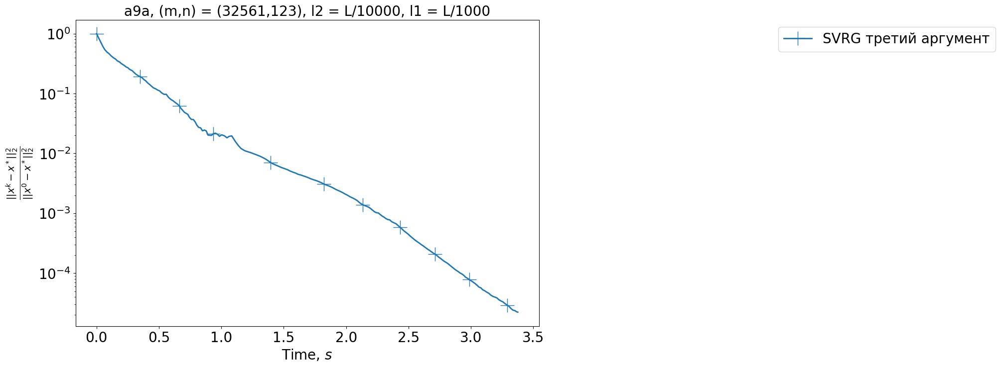

In [136]:
make_plots(args=args_for_plots)

### l1 = L / 1000

In [137]:
l2 = L / 10000
gamma = 1.0/(6*(L+l2))
save_info_period = 100
x_star = read_solution(dataset, l2, L / 1000)[0]
f_star = read_solution(dataset, l2, L / 1000)[1]

sparse_full = True
sparse_stoch = False

In [140]:
for batch_size, S in zip([1, 10, 100], [100, 800, 2000]):
    M = int(2*m/batch_size)
    start = time.time()
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=L / 1000, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    end = time.time()
    print(f"Размер батча: {batch_size}, время: {end - start}")
    print("Найденное значение: ", res['func_vals'][-1])
    print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter']))
    print()

Размер батча: 1, время: 903.2959680557251
Найденное значение:  0.0
Процент ненулевых координат в найденном решении:  35

Размер батча: 10, время: 873.2860190868378
Найденное значение:  0.0
Процент ненулевых координат в найденном решении:  35

Размер батча: 100, время: 886.1675176620483
Найденное значение:  5.551115123125783e-17
Процент ненулевых координат в найденном решении:  35



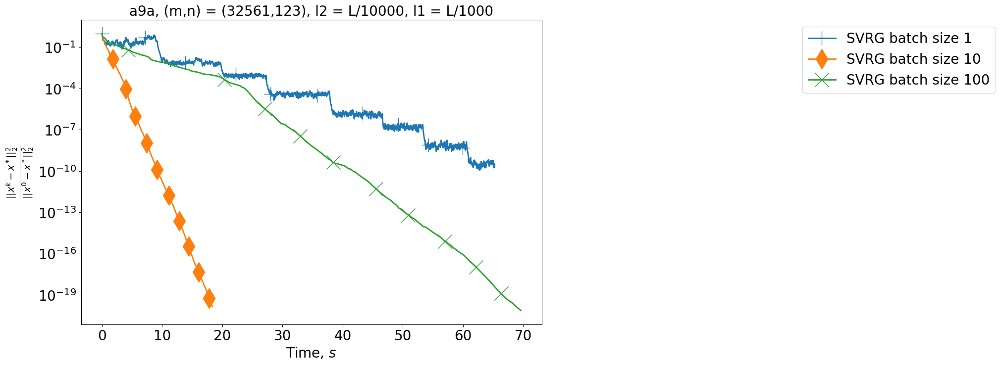

In [141]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/(6*(L+l2))

methods = [
         ['SVRG', [gamma, l2, l1, 100, int(2*m/1), 1], 
           ' batch size 1', 5000],
          ['SVRG', [gamma, l2, l1, 800, int(2*m/10), 10], 
           ' batch size 10', 1000],
           ['SVRG', [gamma, l2, l1, 2000, int(2*m/100), 100], 
           ' batch size 100', 1000],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

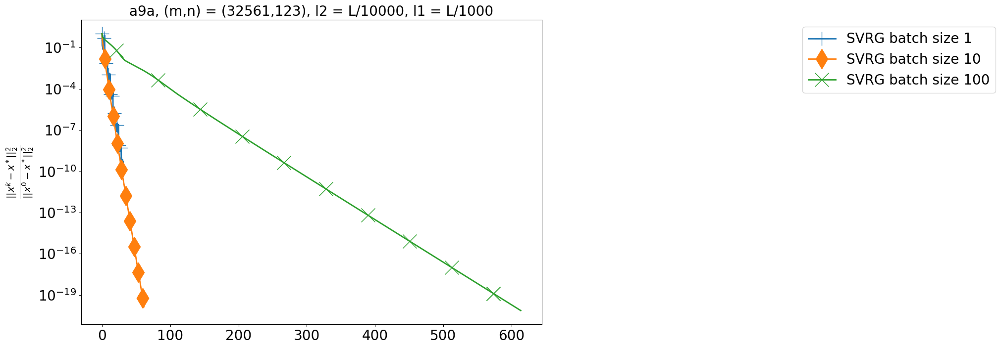

In [142]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

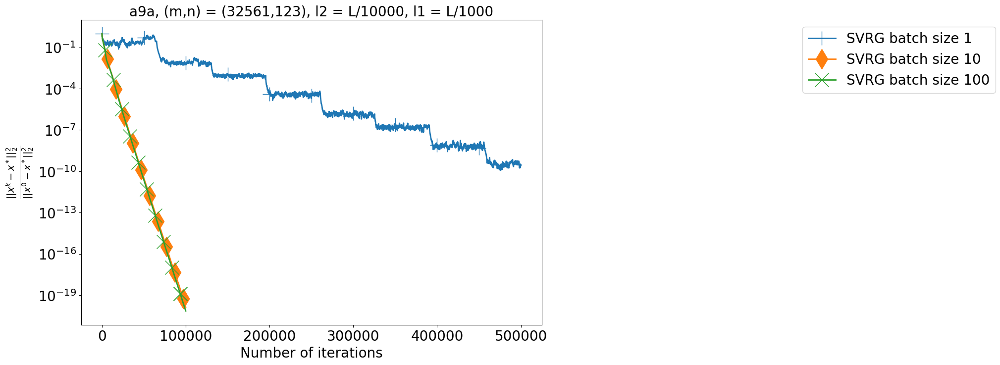

In [143]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

### l1 = 0

In [144]:
l2 = L / 10000
gamma = 1.0/(6*(L+l2))
save_info_period = 100
x_star = read_solution(dataset, l2, 0)[0]
f_star = read_solution(dataset, l2, 0)[1]

sparse_full = True
sparse_stoch = False

In [146]:
for batch_size, S in zip([1, 10, 100], [100, 800, 2000]):
    M = int(2*m/batch_size)
    start = time.time()
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=0, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    end = time.time()
    print(f"Размер батча: {batch_size}, время: {end - start}")
    print("Найденное значение: ", res['func_vals'][-1])
    print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter']))
    print()

Размер батча: 1, время: 559.8215129375458
Найденное значение:  0.0
Процент ненулевых координат в найденном решении:  123

Размер батча: 10, время: 468.7176880836487
Найденное значение:  5.551115123125783e-17
Процент ненулевых координат в найденном решении:  123

Размер батча: 100, время: 969.4677789211273
Найденное значение:  5.551115123125783e-17
Процент ненулевых координат в найденном решении:  123



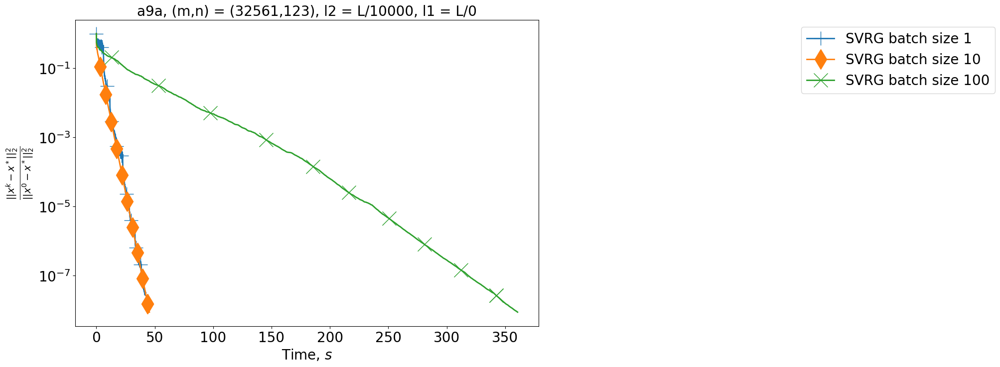

In [147]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = 0
batch_size = 10
gamma = 1.0/(6*(L+l2))

methods = [
         ['SVRG', [gamma, l2, l1, 100, int(2*m/1), 1], 
           ' batch size 1', 5000],
          ['SVRG', [gamma, l2, l1, 800, int(2*m/10), 10], 
           ' batch size 10', 5000],
           ['SVRG', [gamma, l2, l1, 2000, int(2*m/100), 100], 
           ' batch size 100', 5000],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

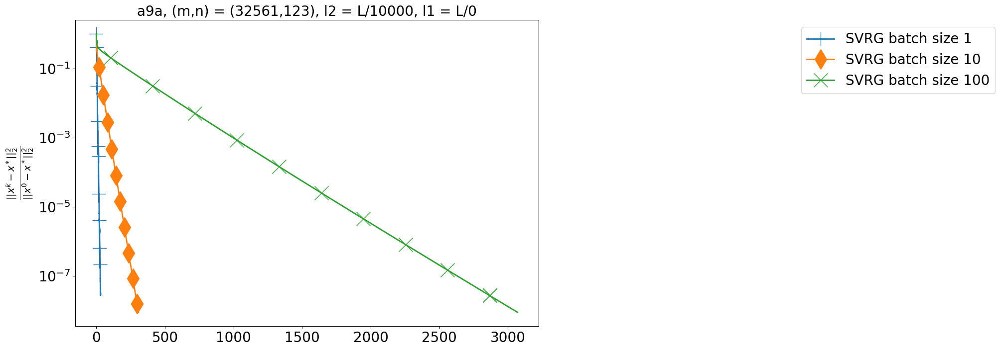

In [148]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

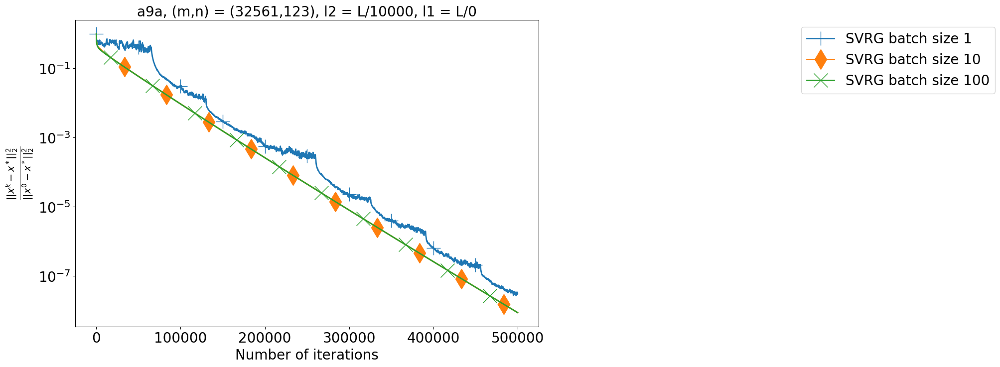

In [149]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

Полученные результаты в большинстве своем соотносятся с теорией. С батчом = 1 метод имеет медленную сходимость, по причине того, что апроксимация градиента слишком грубая, но в задаче без l1 метод показал высокую скорость с хорошим результатом, но все-равно проигрывает в точности. Размер батча = 10 оказался 'золотой серединой'. Быстро и точно сходится. Батч = 100 проигрывает только в скорости вычисления, но зато имеет более хорошие теоретические оценки сходимости. По моему мнению, если при батче = 100 поменять lr, то метод покажет более хороший результат.

## Задание 4. SGD

Имплементируйте $\texttt{prox-SGD}$ с мини-батчингом и постоянным шагом. Имплементируйте $\texttt{prox-SGD}$ с мини-батчингом и периодически уменьшающимся шагом.

In [7]:
with open("dump/test_indices_a9a.txt", 'rb') as file:
    test_indices = pickle.load(file)

filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
x_star = None
f_star = None
S = 3
save_info_period = 100


sparse_full = True
sparse_stoch = False

In [8]:
%%time
res = sgd_const_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 660 ms, sys: 14.3 ms, total: 675 ms
Wall time: 674 ms


Запустите функцию, тестирующую корректность работы

In [9]:
sgd_const_test(res)

Тесты пройдены!


0

In [10]:
with open("dump/test_indices_a9a.txt", 'rb') as file:
    test_indices = pickle.load(file)

filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
gamma_schedule = [gamma, 1, 0.5]
x_star = None
f_star = None
S = 10
save_info_period = 100

sparse_full = True
sparse_stoch = False

In [11]:
%%time
res = sgd_decr_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma_schedule=gamma_schedule, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, max_t=np.inf,
     batch_size=batch_size, indices=test_indices, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 2.23 s, sys: 34.4 ms, total: 2.26 s
Wall time: 2.26 s


Запустите функцию, тестирующую корректность работы

In [12]:
sgd_decr_test(res)

Тесты пройдены!


0

Если тесты пройдены успешно, то выполните эксперименты, описанные в задании.

### SGD const stepsize

In [150]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000

x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
save_info_period = 100

sparse_full = True
sparse_stoch = False

In [152]:
for batch_size, S in zip([1, 10, 100], [100, 800, 2000]):
    for a in 1, 0.1, 0.01:
        M = int(2*m/batch_size)
        gamma = a/(L+l2)
        start = time.time()
        res = sgd_const_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
            sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
            l1=l1, S=S, max_t=np.inf,
            batch_size=batch_size, indices=None, save_info_period=save_info_period, 
            x_star=x_star, f_star=f_star)
        end = time.time()
        print(f"Размер батча: {batch_size}, время: {end - start}")
        print("Найденное значение: ", res['func_vals'][-1])
        print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter']))
        print()

Размер батча: 1, время: 197.91580891609192
Найденное значение:  0.27929210898717294
Процент ненулевых координат в найденном решении:  79

Размер батча: 1, время: 200.7341275215149
Найденное значение:  0.022056265165615263
Процент ненулевых координат в найденном решении:  77

Размер батча: 1, время: 197.1432421207428
Найденное значение:  0.002839989542151977
Процент ненулевых координат в найденном решении:  87

Размер батча: 10, время: 172.25910782814026
Найденное значение:  0.03524392180538838
Процент ненулевых координат в найденном решении:  85

Размер батча: 10, время: 171.0532398223877
Найденное значение:  0.0032480474501680456
Процент ненулевых координат в найденном решении:  83

Размер батча: 10, время: 169.97776055335999
Найденное значение:  0.00017690104549344943
Процент ненулевых координат в найденном решении:  84

Размер батча: 100, время: 254.23856687545776
Найденное значение:  0.0020304949691594687
Процент ненулевых координат в найденном решении:  82

Размер батча: 100, врем

#### batch size = 1

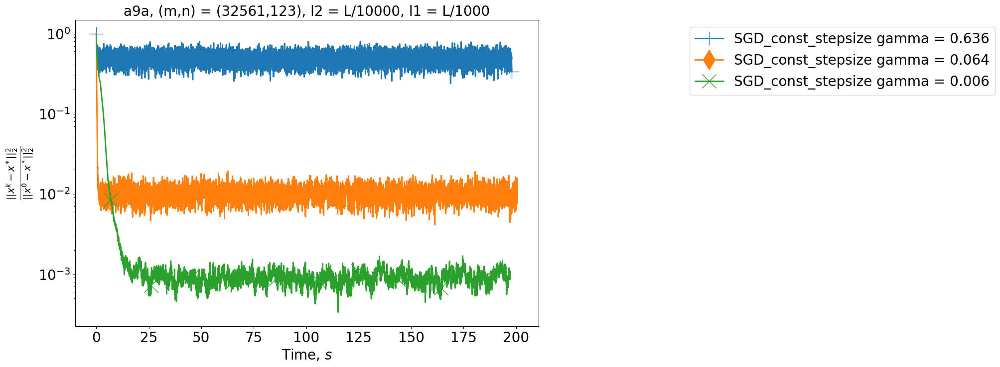

In [154]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 1

methods = [
         ['SGD_const_stepsize', [1/(L+l2), l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(1/(L+l2),3)}', None],
          ['SGD_const_stepsize', [0.1/(L+l2), l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.1/(L+l2), 3)}', None],
           ['SGD_const_stepsize', [0.01/(L+l2), l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.01/(L+l2), 3)}', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

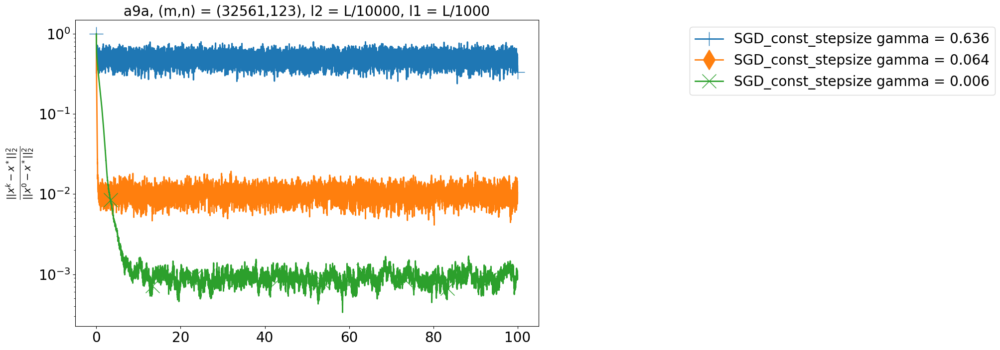

In [155]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

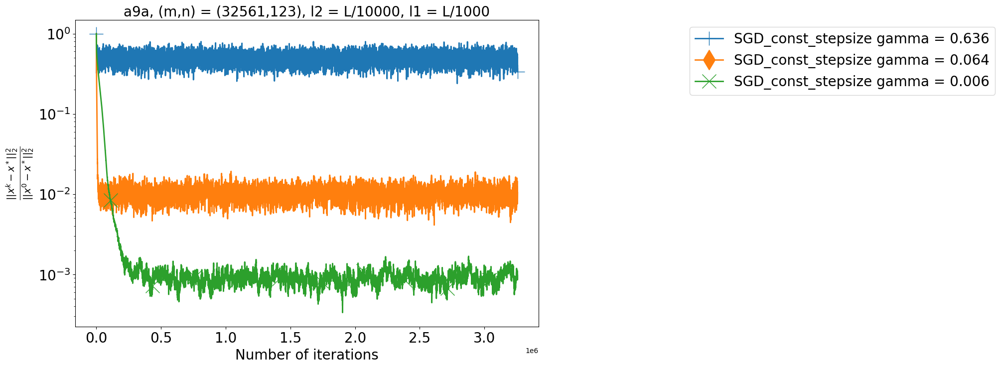

In [156]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

#### batch size = 10

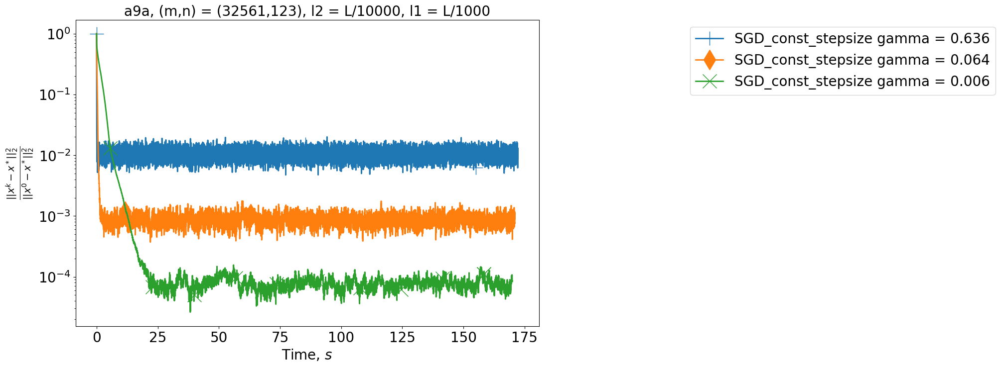

In [158]:
batch_size = 10

methods = [
         ['SGD_const_stepsize', [1/(L+l2), l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(1/(L+l2),3)}', None],
          ['SGD_const_stepsize', [0.1/(L+l2), l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.1/(L+l2), 3)}', None],
           ['SGD_const_stepsize', [0.01/(L+l2), l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.01/(L+l2), 3)}', None],
]
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

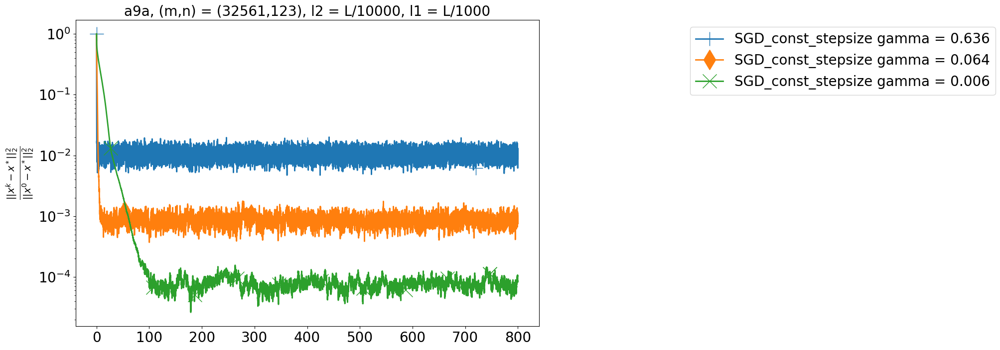

In [159]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

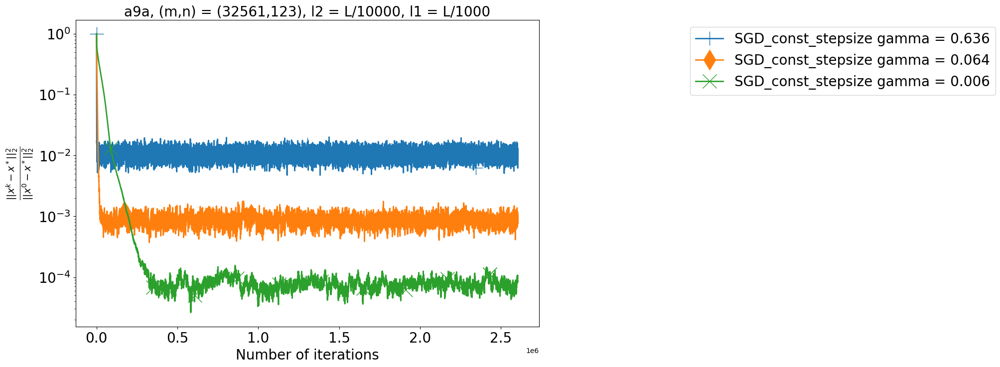

In [160]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

#### batch size = 100

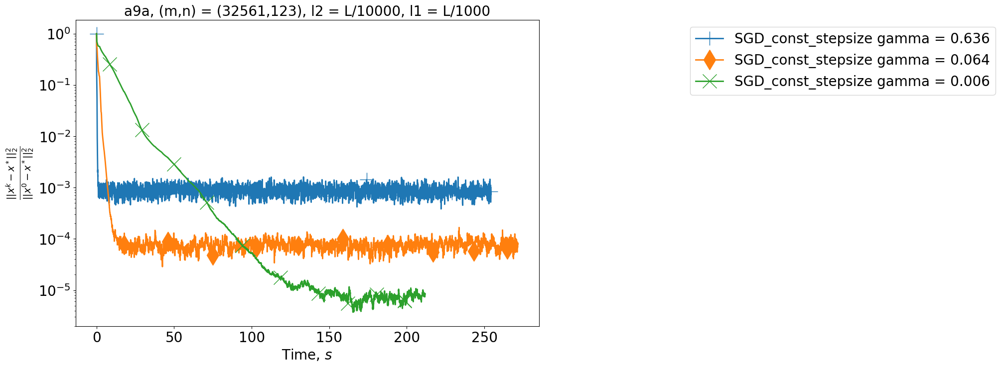

In [161]:
batch_size = 100

methods = [
         ['SGD_const_stepsize', [1/(L+l2), l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(1/(L+l2),3)}', None],
          ['SGD_const_stepsize', [0.1/(L+l2), l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.1/(L+l2), 3)}', None],
           ['SGD_const_stepsize', [0.01/(L+l2), l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.01/(L+l2), 3)}', None],
]
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

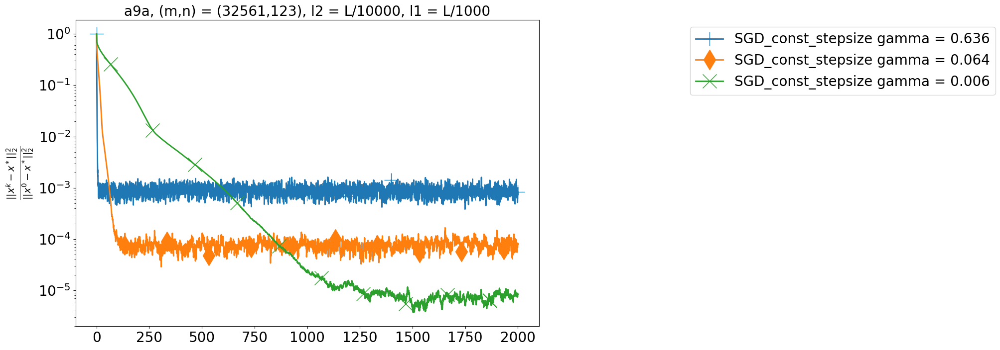

In [162]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

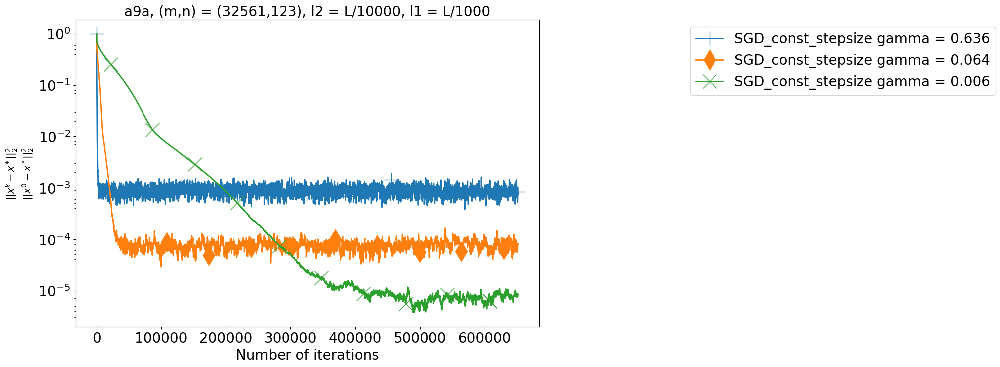

In [163]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

Полученные результаты соответствуют теории. Размер выбираймого lr зависит от желаймой точности. При более меньшем lr медленее сходимость, но зато более точная. Размер батча тоже влият на скорость и точность сходимости. То есть чем больше, тем лучше сходимость, но требуется больше времени, зато lr можно взять побольше.

### SGD decr stepsize

In [33]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/(L+l2)

x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
save_info_period = 100


sparse_full = True
sparse_stoch = False

In [34]:
for batch_size, S in zip([1, 10, 100], [100, 800, 2000]):
    for T in 1, 2:
        for b in 0.5, 0.9:
            M = int(2*m/batch_size)
            gamma_schedule = [gamma, T, b]
            start = time.time()
            res = sgd_decr_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma_schedule=gamma_schedule, l2=l2, 
                sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
                l1=l1, S=S, max_t=np.inf,
                batch_size=batch_size, indices=None, save_info_period=save_info_period, 
                x_star=x_star, f_star=f_star)
            end = time.time()
            print(f"Размер батча: {batch_size}, время: {end - start}")
            print("Найденное значение: ", res['func_vals'][-1])
            print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)
            print()

Размер батча: 1, время: 193.32952737808228
Найденное значение:  8.688373818616091e-05
Процент ненулевых координат в найденном решении:  0.6178861788617886

Размер батча: 1, время: 194.22994685173035
Найденное значение:  2.161064131361856e-05
Процент ненулевых координат в найденном решении:  0.6747967479674797

Размер батча: 1, время: 195.00319004058838
Найденное значение:  5.7917348581515427e-05
Процент ненулевых координат в найденном решении:  0.6666666666666666

Размер батча: 1, время: 195.22680234909058
Найденное значение:  0.00086471525102777
Процент ненулевых координат в найденном решении:  0.6829268292682927

Размер батча: 10, время: 166.66149926185608
Найденное значение:  0.0001263551359971249
Процент ненулевых координат в найденном решении:  0.6422764227642277

Размер батча: 10, время: 163.19380688667297
Найденное значение:  8.49335854558042e-06
Процент ненулевых координат в найденном решении:  0.6422764227642277

Размер батча: 10, время: 162.03302454948425
Найденное значение: 

#### batch size = 1

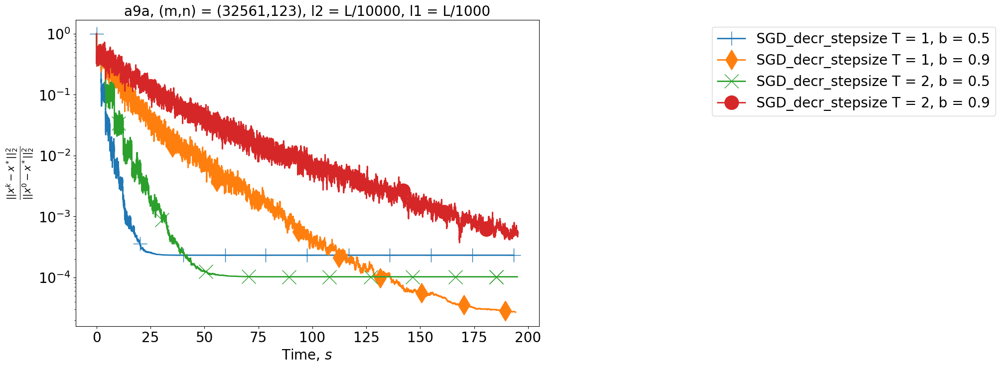

In [62]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 1

methods = [
  *[['SGD_decr_stepsize', [[gamma, 1, b], l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' T = {1}, b = {b}', None] for b in [0.5, 0.9]],
    *[['SGD_decr_stepsize', [[gamma, 2, b], l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' T = {2}, b = {b}', None] for b in [0.5, 0.9]]
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

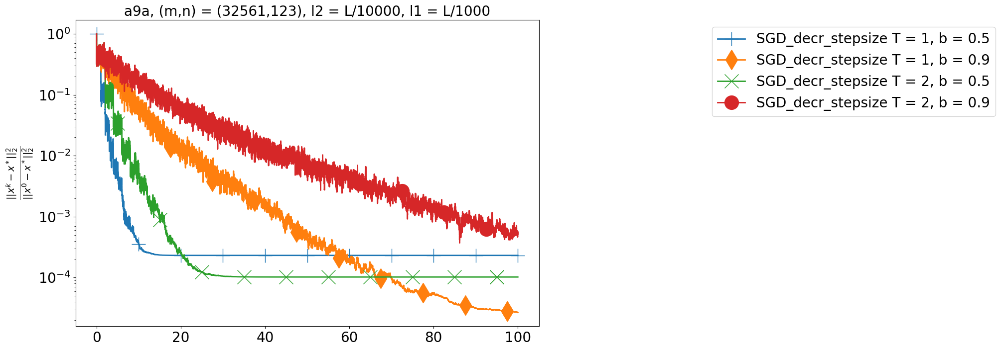

In [63]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

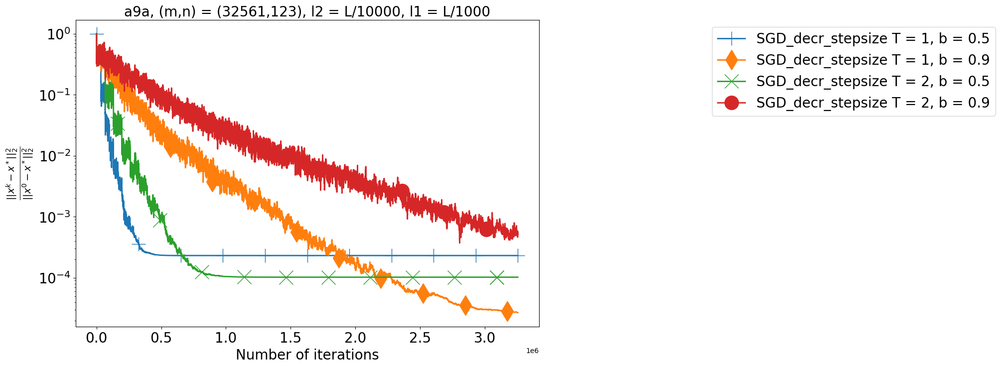

In [64]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

#### batch size = 10

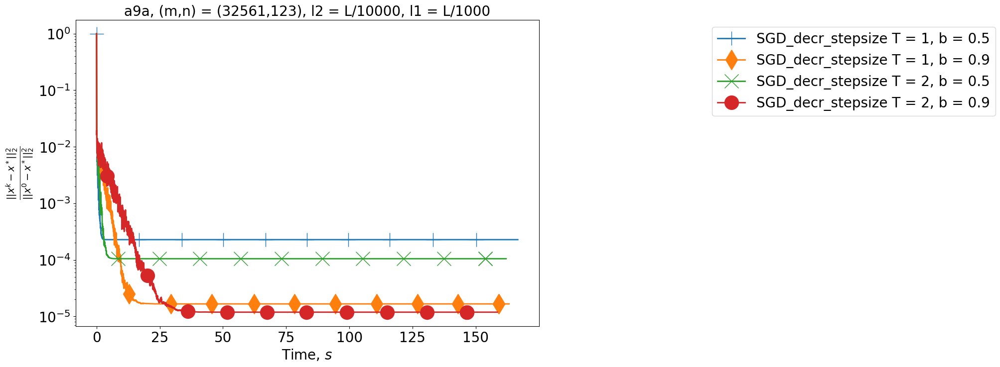

In [68]:
batch_size = 10

methods = [
  *[['SGD_decr_stepsize', [[gamma, 1, b], l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' T = {1}, b = {b}', None] for b in [0.5, 0.9]],
    *[['SGD_decr_stepsize', [[gamma, 2, b], l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' T = {2}, b = {b}', None] for b in [0.5, 0.9]]
]

args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

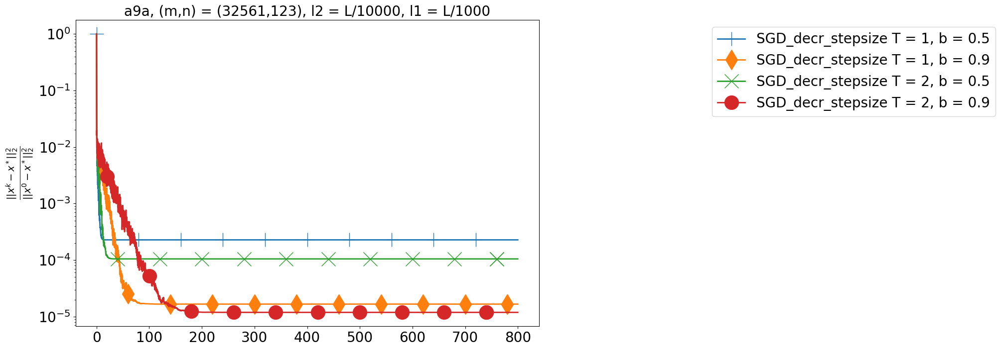

In [69]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

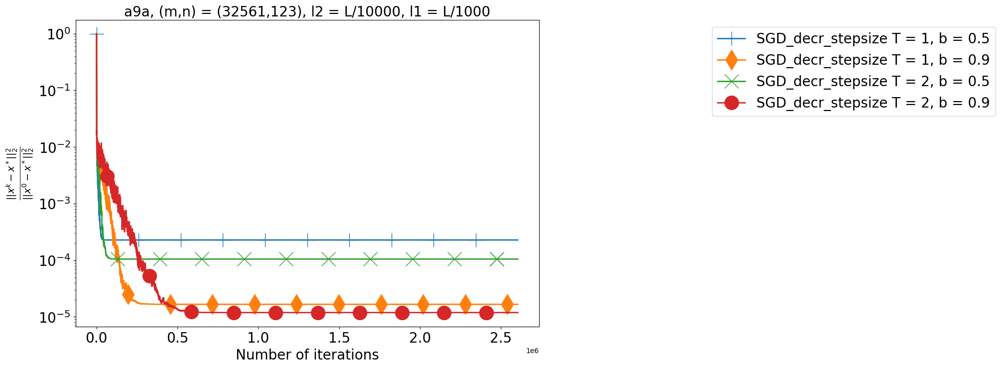

In [70]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

#### batch size = 100

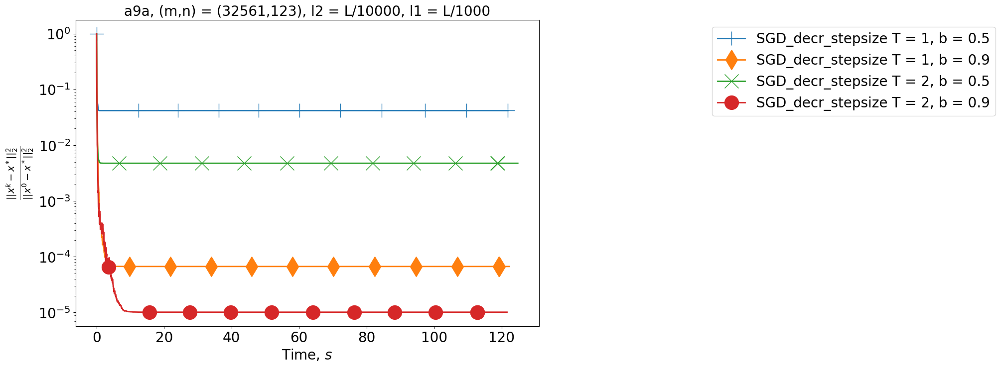

In [71]:
batch_size = 100

methods = [
  *[['SGD_decr_stepsize', [[gamma, 1, b], l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' T = {1}, b = {b}', None] for b in [0.5, 0.9]],
    *[['SGD_decr_stepsize', [[gamma, 2, b], l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' T = {2}, b = {b}', None] for b in [0.5, 0.9]]
]

args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

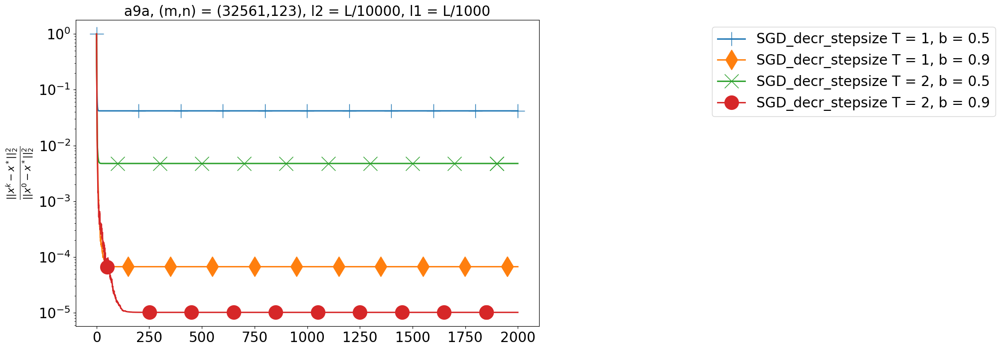

In [72]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

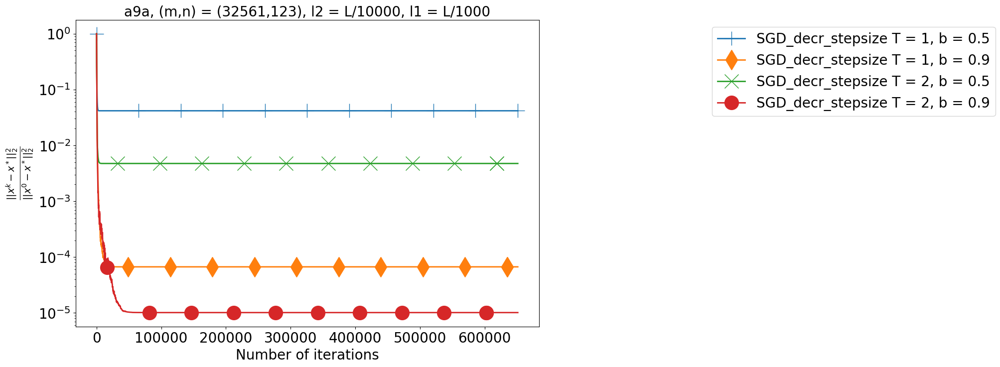

In [73]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

Политика шага напрямую зависит от желаймой точности и выбранного размера батча. То есть результат схож с SGD const stepsize, хотя и наблюдается в меньшей мере (так как шаг уменьшается). Поэтому политику стоит выбирать от желаймой точности и времени работы.

Наилучшие параметры:
<br>
SGD const stepsize:
<br>
    batch size = 1 - gamma = 0.01/(L+l2)
<br>
    batch size = 10 - gamma = 0.1/(L+l2)
<br>
    batch size = 100 - gamma = 1/(L+l2)
<br>
SGD decr stepsize:
<br>
    batch size = 1 - T = 1, b = 0.5
<br>
    batch size = 10 - T = 1, b = 0.5
<br>
    batch size = 100 - T = 1, b = 0.5

## Задание 5. prox-GD, FISTA и GD

Имплементируйте $\texttt{prox-GD}$, $\texttt{FISTA}$ и $\texttt{GD}$

In [83]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = None
f_star = None
S = 1000
save_info_period = 10


sparse = True

In [84]:
%%time
res = prox_gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 4.56 s, sys: 0 ns, total: 4.56 s
Wall time: 4.65 s


Запустите функцию, тестирующую корректность работы

In [85]:
prox_gd_test(res)

Тесты пройдены!


0

In [77]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = None
f_star = None
S = 1000
save_info_period = 10


sparse = True

In [78]:
%%time
res = FISTA(filename=filename, x_init=x_init, A=A, y=y, L=L+l2, mu=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 1.88 s, sys: 0 ns, total: 1.88 s
Wall time: 1.88 s


Запустите функцию, тестирующую корректность работы

In [79]:
fista_test(res)

Тесты пройдены!


0

In [80]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = None
f_star = None
S = 1000
save_info_period = 10


sparse = True

In [81]:
%%time
res = gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 1.75 s, sys: 0 ns, total: 1.75 s
Wall time: 1.75 s


Запустите функцию, тестирующую корректность работы

In [82]:
gd_test(res)

Тесты пройдены!


0

Если тесты пройдены успешно, то выполните эксперименты, описанные в задании.

### prox GD

In [99]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
S = 5000
save_info_period = 10

sparse = True

In [100]:
%%time
res = prox_gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 21.5 s, sys: 1.82 ms, total: 21.5 s
Wall time: 21.6 s


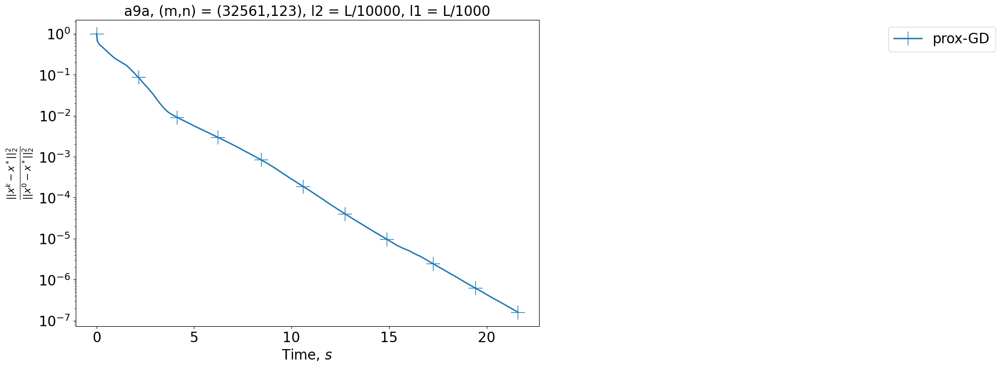

In [106]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"

methods = [
         ['prox-GD', [gamma, l2, l1, S], 
           '', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

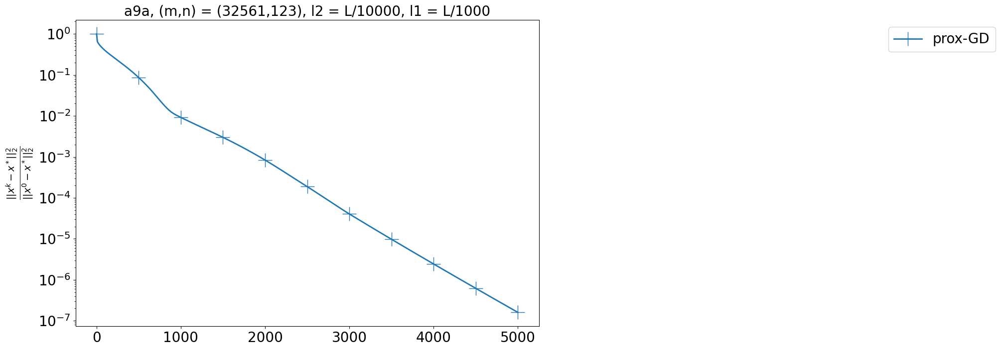

In [108]:
args_for_plots = [dataset, filename, mode_y, "data_passes", figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

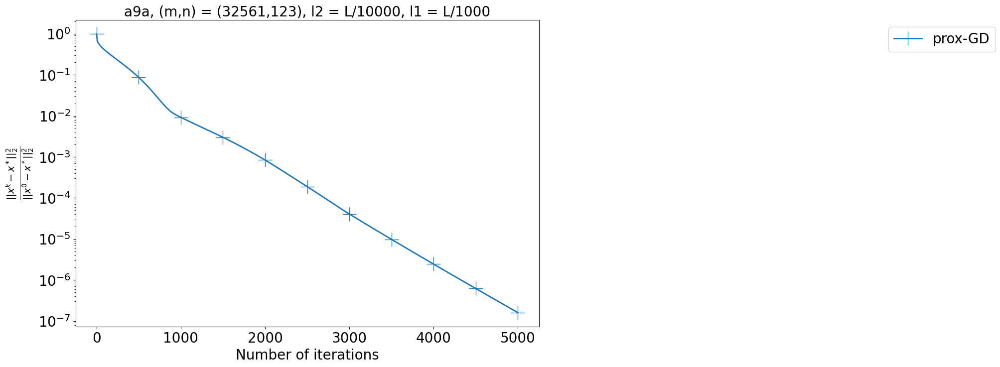

In [109]:
args_for_plots = [dataset, filename, mode_y, "iters", figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

### FISTA

In [110]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
S = 5000
save_info_period = 10

sparse = True

In [111]:
%%time
res = FISTA(filename=filename, x_init=x_init, A=A, y=y, L=L+l2, mu=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 24.1 s, sys: 7.02 ms, total: 24.1 s
Wall time: 24.2 s


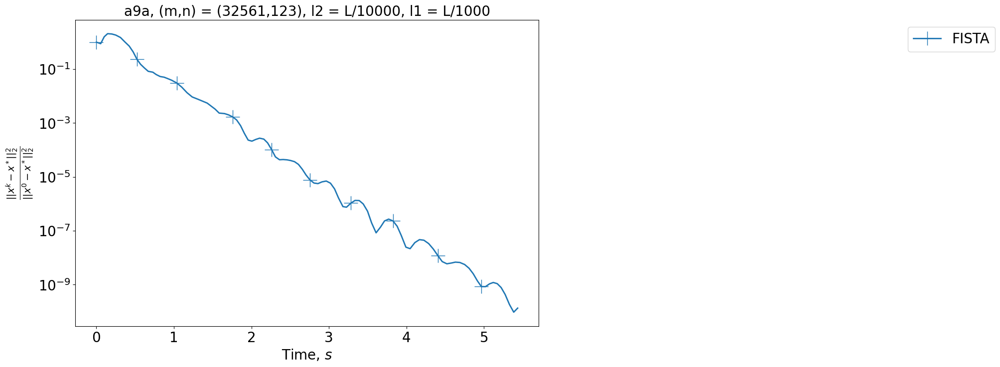

In [116]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"

methods = [
         ['FISTA', [l2, l1, S], 
           '', 100],
]
mode_y = 'squared_distances'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

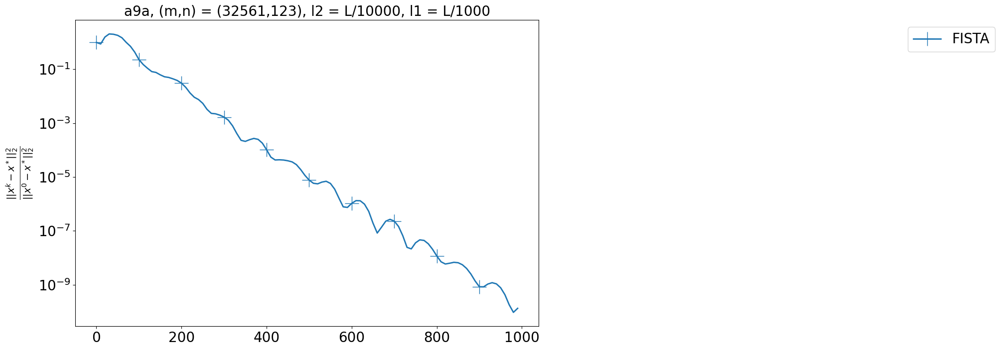

In [117]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

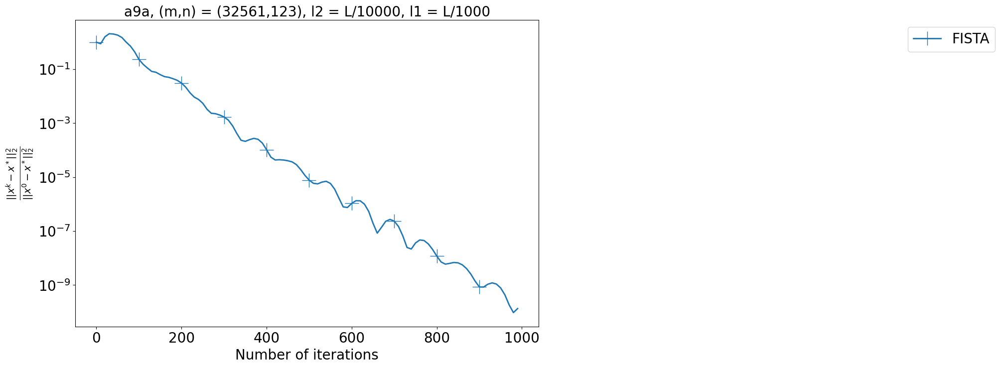

In [118]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

### GD

In [13]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
S = 5000
save_info_period = 10

sparse = True

In [14]:
for a in 1, 0.1, 0.01:
    gamma = a/((L+l2))
    start = time.time()
    res = gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    end = time.time()
    print(f"Gamma: {gamma}, время: {end - start}")
    print("Найденное значение: ", res['func_vals'][-1])
    print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)
    print()

Gamma: 0.6361012019211072, время: 11.461293458938599
Найденное значение:  6.730821508632578e-05
Процент ненулевых координат в найденном решении:  1.0

Gamma: 0.06361012019211072, время: 8.50523829460144
Найденное значение:  0.03850768724613529
Процент ненулевых координат в найденном решении:  1.0

Gamma: 0.006361012019211072, время: 9.180415868759155
Найденное значение:  0.19864628808556628
Процент ненулевых координат в найденном решении:  1.0



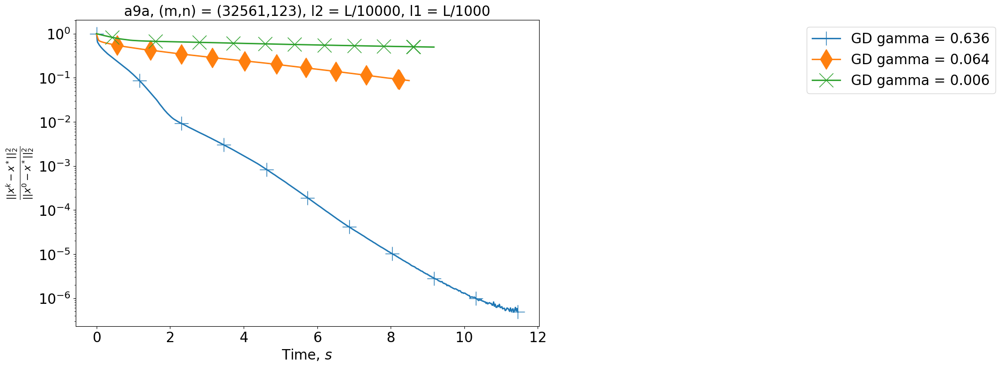

In [20]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"

methods = [
         ['GD', [1/((L+l2)), l2, l1, S], 
           f' gamma = {np.round(1/((L+l2)), 3)}', None],
         ['GD', [0.1/((L+l2)), l2, l1, S], 
           f' gamma = {np.round(0.1/((L+l2)), 3)}', None],
         ['GD', [0.01/((L+l2)), l2, l1, S], 
           f' gamma = {np.round(0.01/((L+l2)),3)}', None],
]
mode_y = 'squared_distances'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)

args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

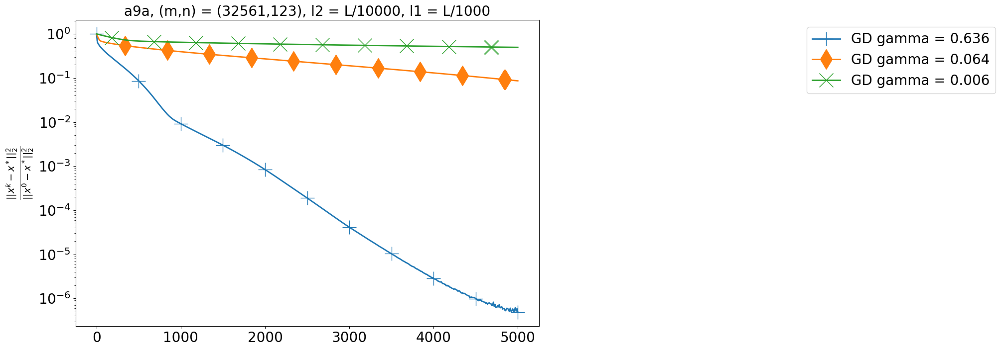

In [21]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

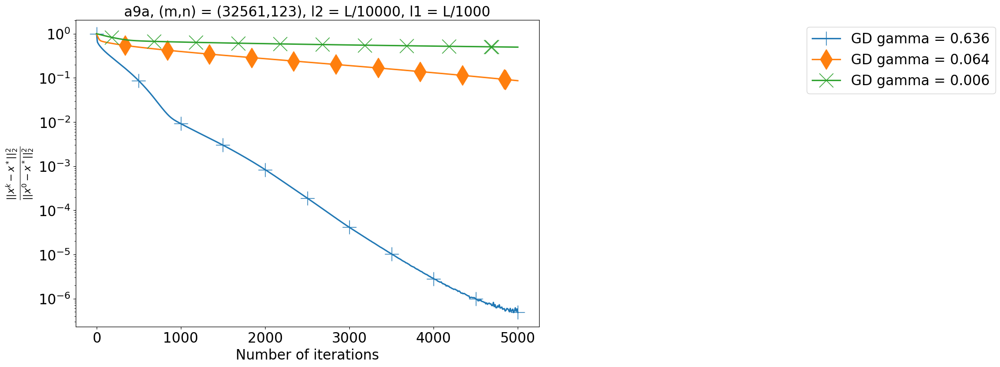

In [23]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

Для GD самый лучший шаг оказался самый большой. При других lr метод сходится слишком медленно, хотя и может достичь более хороших результатов. Также по данным эксперементам заметна разница в постановке задачи (prox GD  и GD c l1). Использоваие прокс оператора улучшает скорость и точность. Но, как и согласно теории, лучший результат получился у ускоренного метода.

## Задание 6. Сравнение методов

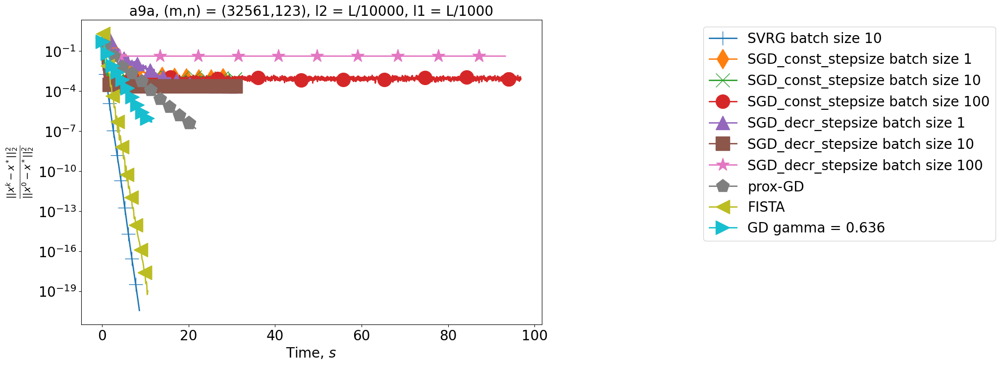

In [38]:
dataset = "a9a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
lim = 5000
methods = [
    ['SVRG', [1.0/(6*(L+l2)), l2, l1, 800, int(2*m/10), 10], 
           ' batch size 10', 1000],
    ['SGD_const_stepsize', [0.01/(L+l2), l2, l1, 100, 1, int(2*m)], 
           f' batch size 1', lim],
    ['SGD_const_stepsize', [0.1/(L+l2), l2, l1, 800, 10, int(2*m/10)], 
           f' batch size 10', lim],
    ['SGD_const_stepsize', [1/(L+l2), l2, l1, 2000, 100, int(2*m/100)], 
           f' batch size 100', lim],
    ['SGD_decr_stepsize', [[1.0/(L+l2), 1, 0.5], l2, l1, 100, 1, int(2*m)], 
           f' batch size 1', lim],
    ['SGD_decr_stepsize', [[1.0/(L+l2), 1, 0.5], l2, l1, 800, 10, int(2*m) / 10], 
           f' batch size 10', lim],
    ['SGD_decr_stepsize', [[1.0/(L+l2), 1, 0.5], l2, l1, 2000, 100, int(2*m) / 100], 
           f' batch size 100', lim],
    ['prox-GD', [1.0/((L+l2)), l2, l1, 5000],  '', None],
    ['FISTA', [l2, l1, S], '', 200],
    ['GD', [1/((L+l2)), l2, l1, S], f' gamma = {np.round(1/((L+l2)), 3)}', None],
         
]
mode_y = 'squared_distances'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)

args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

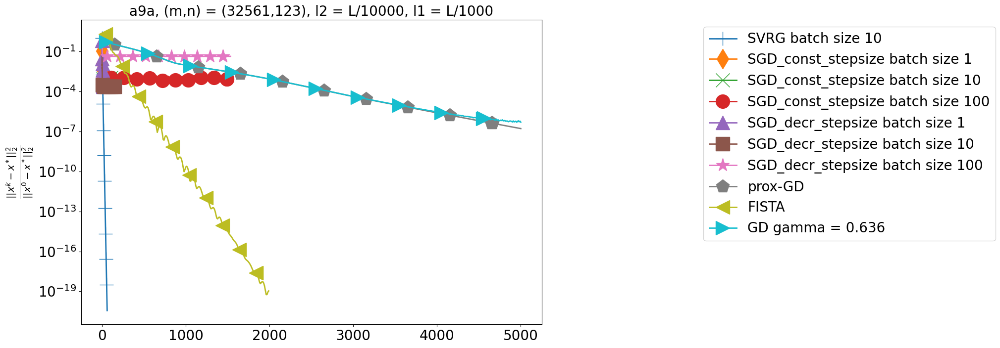

In [39]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

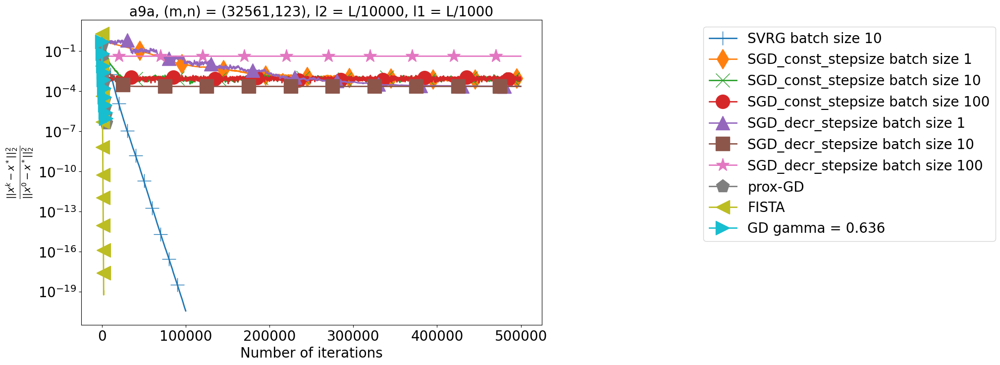

In [40]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

Полученные результаты соответствуют теории. Лучшим методом по точности остается FISTA. Конкурировать с ним может SVRG, что тоже достаточно логично для задачи логистической регрессии. Особенный прирост данный метод дает в скорости. GD  и prox GD тоже показывают хороший результат но сходятся значительно медленнее. SGD, как и ожидалось, доходит до определенного порога и осциллирует.

## Задание 7. Эксперименты с другим датасетом

In [164]:
%%time
dataset = "a5a"
A, y, m, n, sparsity_A = prepare_data(dataset)
print("Число функций в сумме: ", m, ", размерность задачи: ", n)
L, average_L, worst_L = compute_L(dataset, A) 
print("Константа гладкости всей функции: ", L)
print("Средняя константа гладкости     : ", average_L)
print("Худшая константа гладкости      : ", worst_L)
print("Доля ненулевых элементов: ", sparsity_A)

Число функций в сумме:  6414 , размерность задачи:  122
Константа гладкости всей функции:  1.5740271677041662
Средняя константа гладкости     :  3.466596507639382
Худшая константа гладкости      :  3.5
Доля ненулевых элементов:  0.11365890188982093
CPU times: user 67.7 ms, sys: 0 ns, total: 67.7 ms
Wall time: 79.9 ms


In [165]:
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 10
M = int(2*m/batch_size)
gamma = 1.0/(6*(L+l2))
x_star = None
f_star = None
S = 3000
save_info_period = 100
x_init = np.ones(n)

sparse_full = True
sparse_stoch = False

In [53]:
%%time
res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=l1, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
print("Найденное значение: ", res['func_vals'][-1])
print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)

Найденное значение:  0.3604071146692565
Процент ненулевых координат в найденном решении:  0.2786885245901639
CPU times: user 5min 30s, sys: 286 ms, total: 5min 30s
Wall time: 5min 32s


In [54]:
save_solution(dataset, l2, L / 1000, res['last_iter'], res['func_vals'][-1])

### SVRG

In [166]:
gamma = 1.0/(6*(L+l2))
save_info_period = 100
x_star = read_solution(dataset, l2, L / 1000)[0]
f_star = read_solution(dataset, l2, L / 1000)[1]

sparse_full = True
sparse_stoch = False

In [167]:
for batch_size, S in zip([1, 10, 100], [100, 800, 2000]):
    M = int(2*m/batch_size)
    start = time.time()
    res = svrg(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
     l1=L / 1000, S=S, M=M, max_t=np.inf,
     batch_size=batch_size, indices=None, save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    end = time.time()
    print(f"Размер батча: {batch_size}, время: {end - start}")
    print("Найденное значение: ", res['func_vals'][-1])
    print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)
    print()

Размер батча: 1, время: 87.50884771347046
Найденное значение:  0.0
Процент ненулевых координат в найденном решении:  0.2786885245901639

Размер батча: 10, время: 82.9801299571991
Найденное значение:  0.0
Процент ненулевых координат в найденном решении:  0.2786885245901639

Размер батча: 100, время: 113.25722026824951
Найденное значение:  0.0
Процент ненулевых координат в найденном решении:  0.2786885245901639



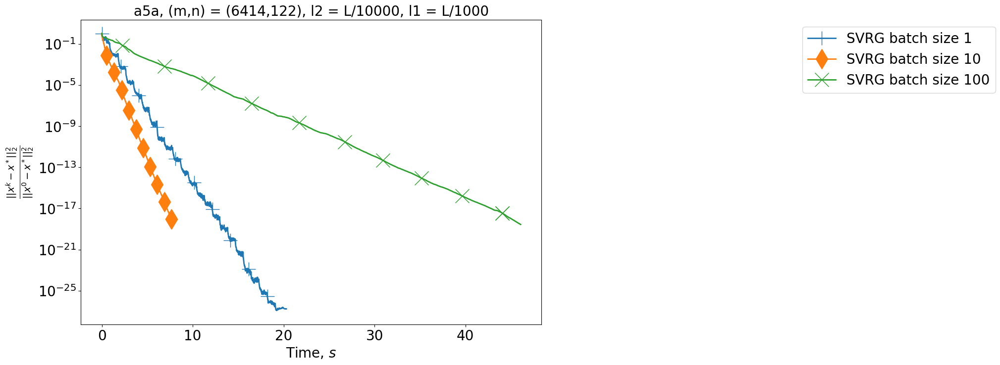

In [169]:
dataset = "a5a"
filename=dataset+"_x_init_all_ones"
gamma = 1.0/(6*(L+l2))

methods = [
         ['SVRG', [gamma, l2, l1, 100, int(2*m/1), 1], 
           ' batch size 1', 3000],
          ['SVRG', [gamma, l2, l1, 800, int(2*m/10), 10], 
           ' batch size 10', 1000],
           ['SVRG', [gamma, l2, l1, 2000, int(2*m/100), 100], 
           ' batch size 100', 1000],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

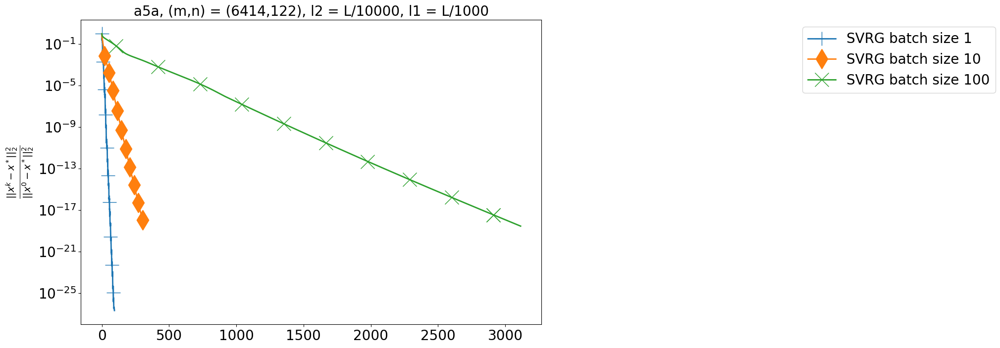

In [62]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

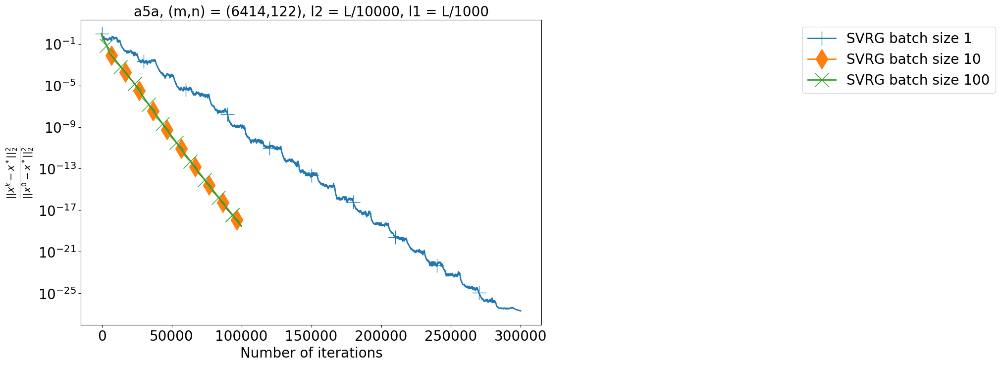

In [63]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

В данной задаче batch size = 1 показал себя лучше, чем в прошлой, но все-равно размер батча стоит брать больше.

### SGD

In [64]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000

x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
save_info_period = 100


sparse_full = True
sparse_stoch = False

In [65]:
for batch_size, S in zip([1, 10, 100], [100, 800, 2000]):
    for a in 1, 0.1, 0.01:
        M = int(2*m/batch_size)
        gamma = a/(L+l2)
        start = time.time()
        res = sgd_const_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
            sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
            l1=l1, S=S, max_t=np.inf,
            batch_size=batch_size, indices=None, save_info_period=save_info_period, 
            x_star=x_star, f_star=f_star)
        end = time.time()
        print(f"Размер батча: {batch_size}, время: {end - start}")
        print("Найденное значение: ", res['func_vals'][-1])
        print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)
        print()

Размер батча: 1, время: 32.77580451965332
Найденное значение:  0.2858070915694196
Процент ненулевых координат в найденном решении:  0.6721311475409836

Размер батча: 1, время: 32.91620421409607
Найденное значение:  0.02185603370443795
Процент ненулевых координат в найденном решении:  0.6721311475409836

Размер батча: 1, время: 33.02003622055054
Найденное значение:  0.0017929300751104993
Процент ненулевых координат в найденном решении:  0.7131147540983607

Размер батча: 10, время: 31.08714771270752
Найденное значение:  0.017320445537319873
Процент ненулевых координат в найденном решении:  0.680327868852459

Размер батча: 10, время: 30.965223789215088
Найденное значение:  0.002278854994939128
Процент ненулевых координат в найденном решении:  0.6721311475409836

Размер батча: 10, время: 29.935855388641357
Найденное значение:  0.00016926640737163767
Процент ненулевых координат в найденном решении:  0.7131147540983607

Размер батча: 100, время: 89.69757747650146
Найденное значение:  0.00147

#### batch size = 1

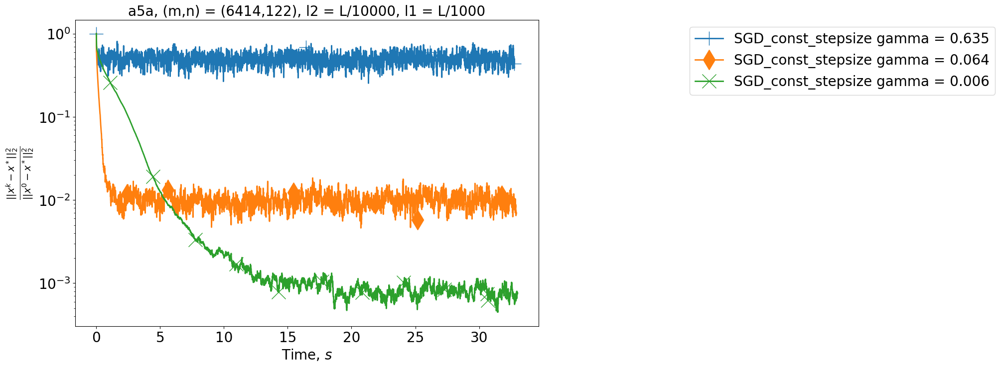

In [66]:
dataset = "a5a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 1

methods = [
         ['SGD_const_stepsize', [1/(L+l2), l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(1/(L+l2),3)}', None],
          ['SGD_const_stepsize', [0.1/(L+l2), l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.1/(L+l2), 3)}', None],
           ['SGD_const_stepsize', [0.01/(L+l2), l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.01/(L+l2), 3)}', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

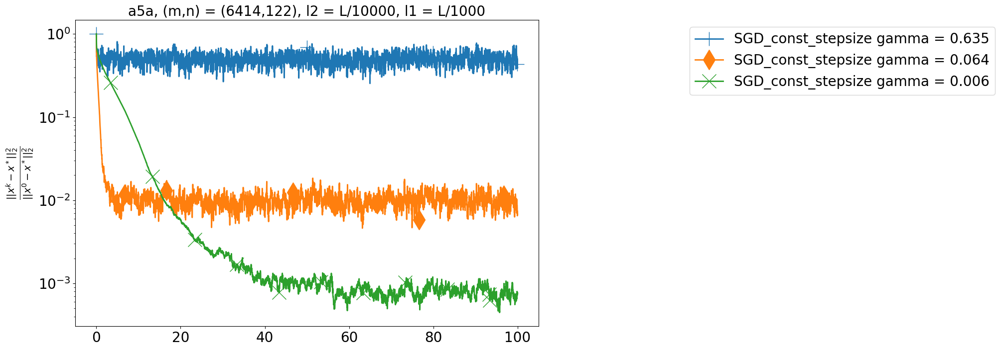

In [67]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

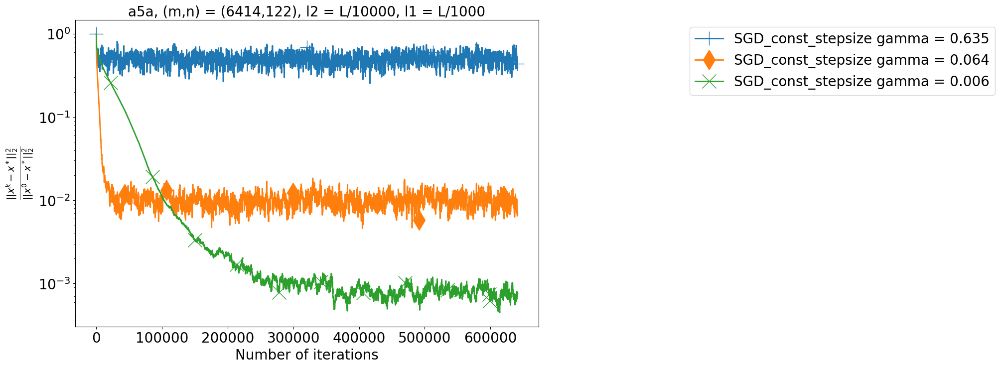

In [68]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

#### batch size = 10

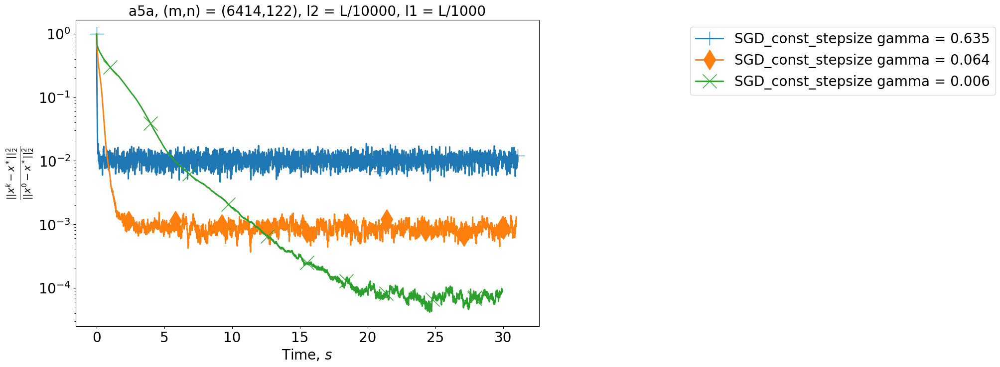

In [69]:
batch_size = 10

methods = [
         ['SGD_const_stepsize', [1/(L+l2), l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(1/(L+l2),3)}', None],
          ['SGD_const_stepsize', [0.1/(L+l2), l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.1/(L+l2), 3)}', None],
           ['SGD_const_stepsize', [0.01/(L+l2), l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.01/(L+l2), 3)}', None],
]
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

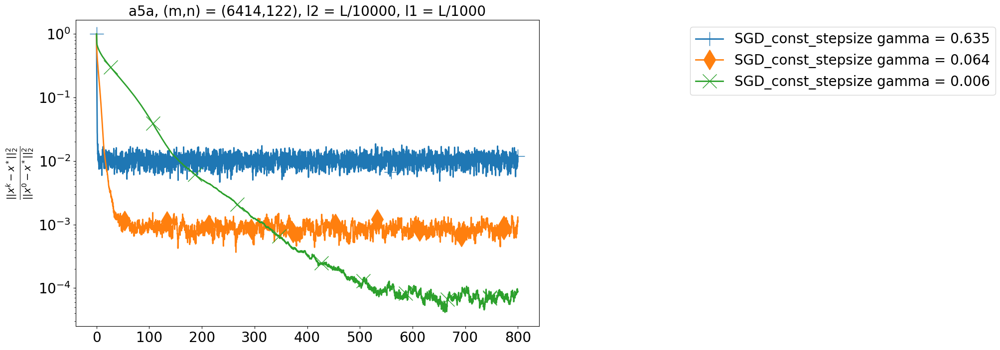

In [70]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

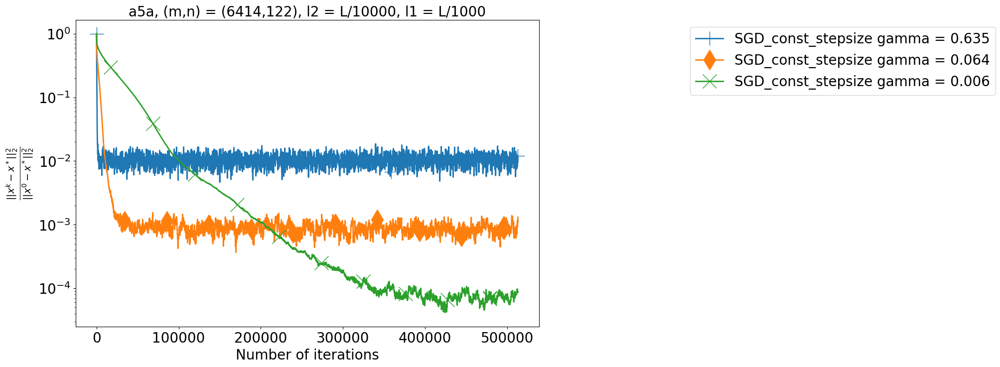

In [71]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

#### batch size = 100

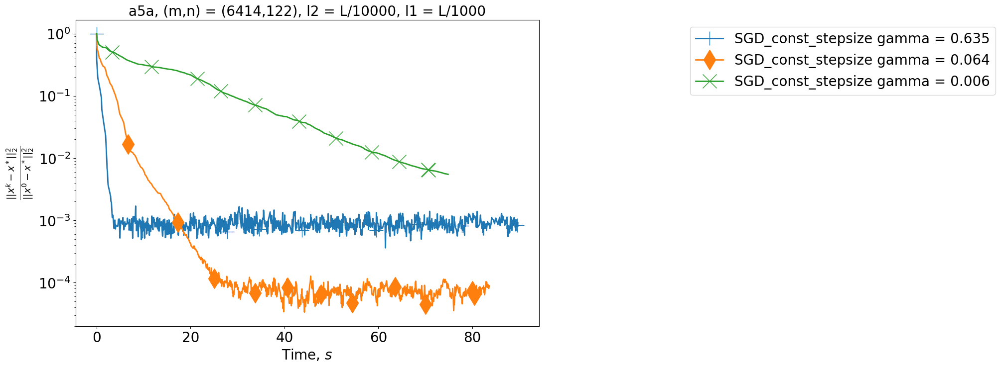

In [72]:
batch_size = 100

methods = [
         ['SGD_const_stepsize', [1/(L+l2), l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(1/(L+l2),3)}', None],
          ['SGD_const_stepsize', [0.1/(L+l2), l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.1/(L+l2), 3)}', None],
           ['SGD_const_stepsize', [0.01/(L+l2), l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' gamma = {np.round(0.01/(L+l2), 3)}', None],
]
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

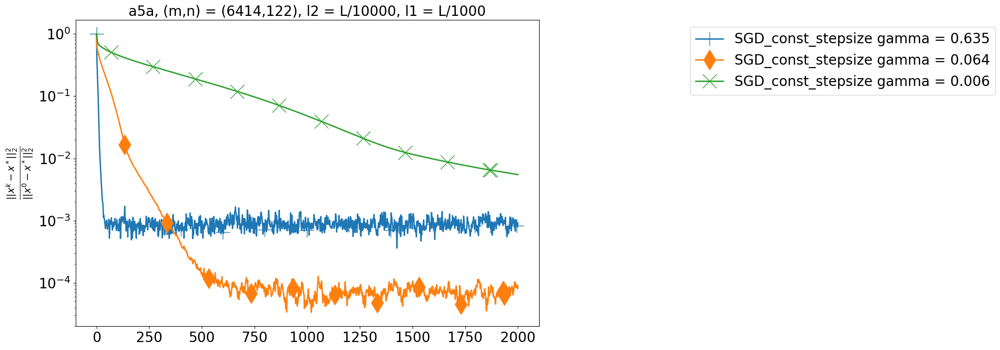

In [73]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

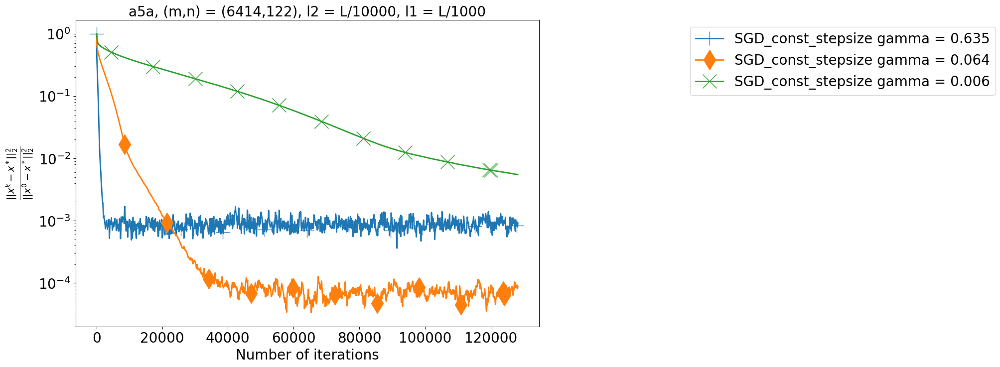

In [74]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

### SGD decr stepsize

In [77]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/(L+l2)

x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
save_info_period = 100

sparse_full = True
sparse_stoch = False

In [78]:
for batch_size, S in zip([1, 10, 100], [100, 800, 2000]):
    for T in 1, 2:
        for b in 0.5, 0.9:
            M = int(2*m/batch_size)
            gamma_schedule = [gamma, T, b]
            start = time.time()
            res = sgd_decr_stepsize(filename=filename, x_init=x_init, A=A, y=y, gamma_schedule=gamma_schedule, l2=l2, 
                sparse_full=sparse_full, sparse_stoch=sparse_stoch, 
                l1=l1, S=S, max_t=np.inf,
                batch_size=batch_size, indices=None, save_info_period=save_info_period, 
                x_star=x_star, f_star=f_star)
            end = time.time()
            print(f"Размер батча: {batch_size}, время: {end - start}")
            print("Найденное значение: ", res['func_vals'][-1])
            print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)
            print()

Размер батча: 1, время: 34.89009094238281
Найденное значение:  0.0005683380351803602
Процент ненулевых координат в найденном решении:  0.680327868852459

Размер батча: 1, время: 34.95086193084717
Найденное значение:  0.00012465455741994536
Процент ненулевых координат в найденном решении:  0.7131147540983607

Размер батча: 1, время: 34.1786003112793
Найденное значение:  0.0003871047598398847
Процент ненулевых координат в найденном решении:  0.6885245901639344

Размер батча: 1, время: 33.046536922454834
Найденное значение:  0.0011735336013207753
Процент ненулевых координат в найденном решении:  0.6967213114754098

Размер батча: 10, время: 29.638922691345215
Найденное значение:  0.0014319322166946313
Процент ненулевых координат в найденном решении:  0.7213114754098361

Размер батча: 10, время: 30.46493625640869
Найденное значение:  7.615559483370449e-05
Процент ненулевых координат в найденном решении:  0.6885245901639344

Размер батча: 10, время: 30.51689600944519
Найденное значение:  0.0

#### batch size = 1

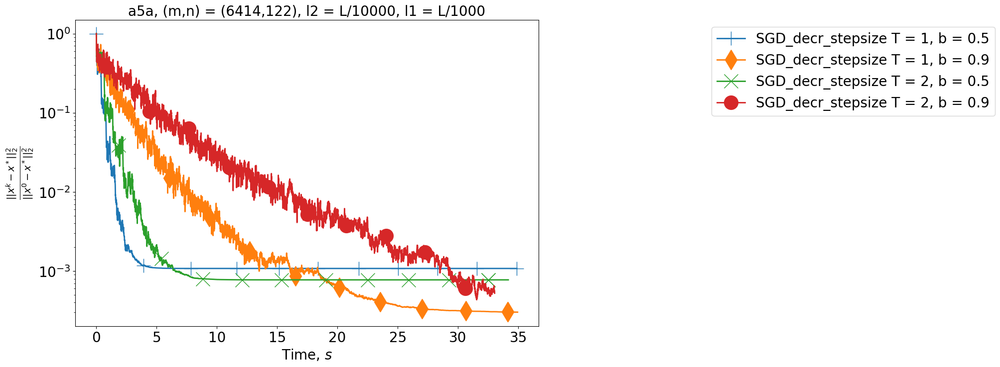

In [80]:
dataset = "a5a"
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
batch_size = 1

methods = [
  *[['SGD_decr_stepsize', [[gamma, 1, b], l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' T = {1}, b = {b}', None] for b in [0.5, 0.9]],
    *[['SGD_decr_stepsize', [[gamma, 2, b], l2, l1, 100, batch_size, int(2*m/batch_size)], 
           f' T = {2}, b = {b}', None] for b in [0.5, 0.9]]
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)
args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

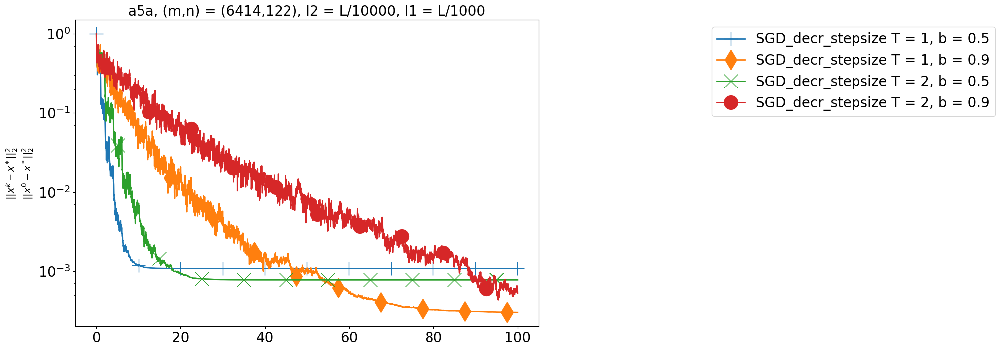

In [81]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

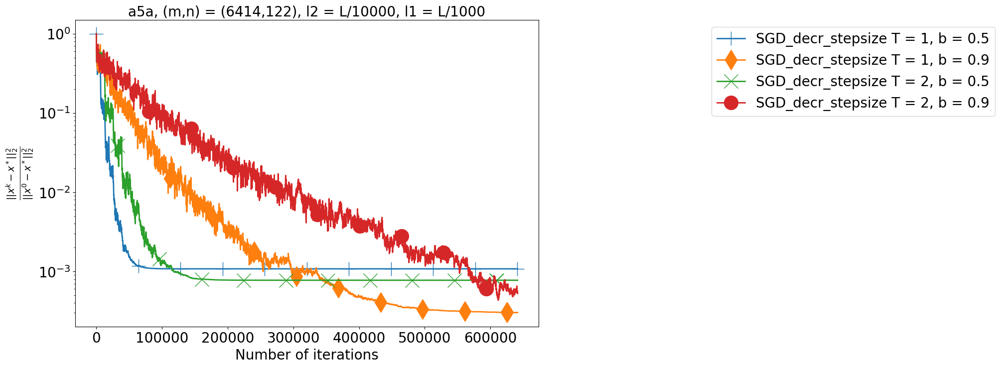

In [82]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

#### batch size = 10

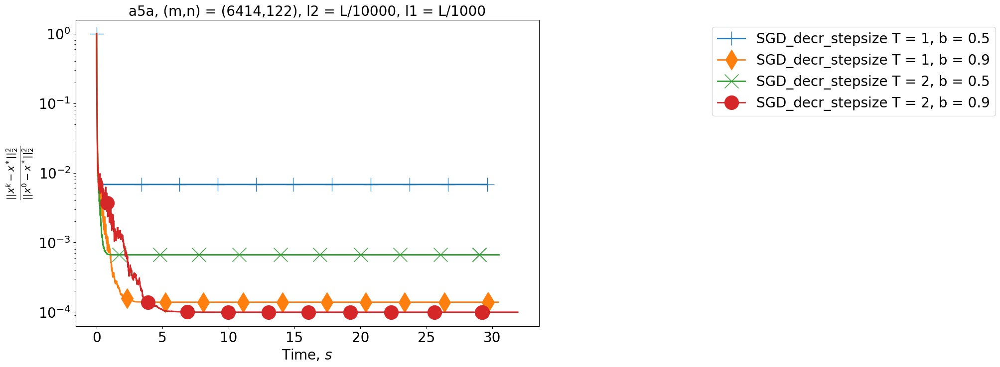

In [83]:
batch_size = 10

methods = [
  *[['SGD_decr_stepsize', [[gamma, 1, b], l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' T = {1}, b = {b}', None] for b in [0.5, 0.9]],
    *[['SGD_decr_stepsize', [[gamma, 2, b], l2, l1, 800, batch_size, int(2*m/batch_size)], 
           f' T = {2}, b = {b}', None] for b in [0.5, 0.9]]
]

args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

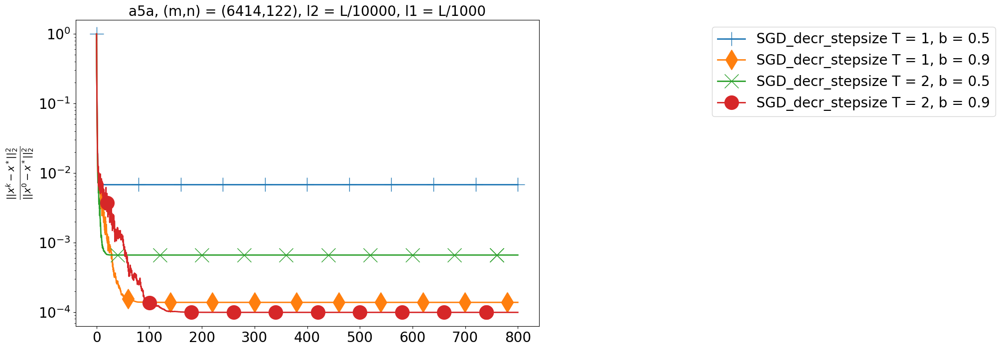

In [84]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

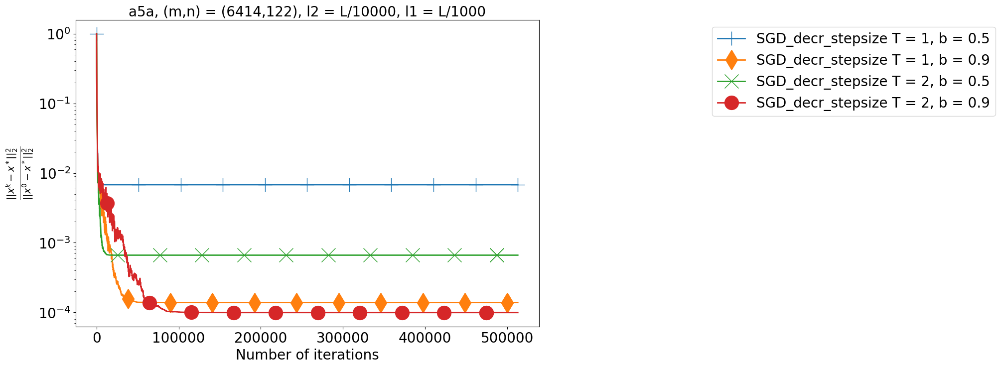

In [85]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

#### batch size = 100

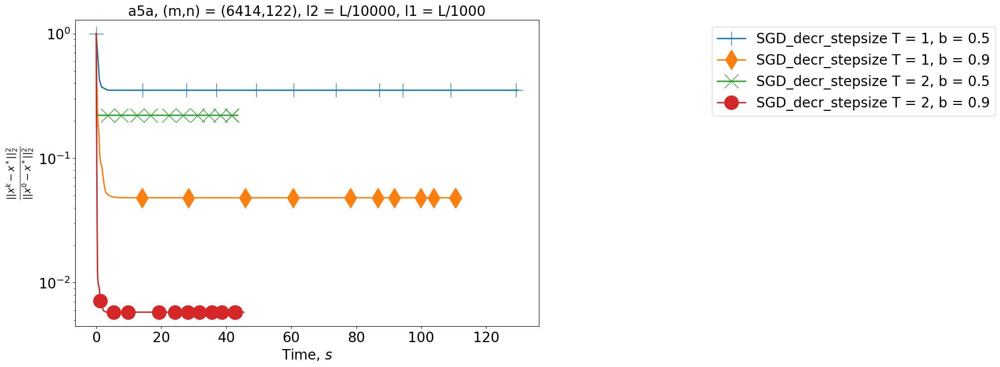

In [86]:
batch_size = 100

methods = [
  *[['SGD_decr_stepsize', [[gamma, 1, b], l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' T = {1}, b = {b}', None] for b in [0.5, 0.9]],
    *[['SGD_decr_stepsize', [[gamma, 2, b], l2, l1, 2000, batch_size, int(2*m/batch_size)], 
           f' T = {2}, b = {b}', None] for b in [0.5, 0.9]]
]

args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

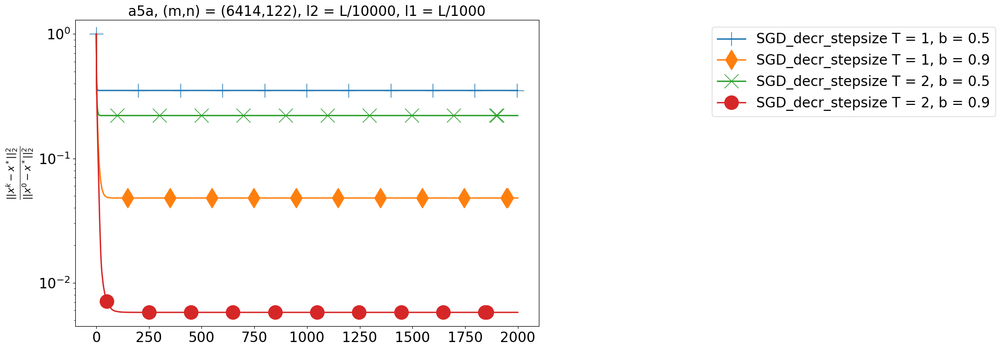

In [87]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

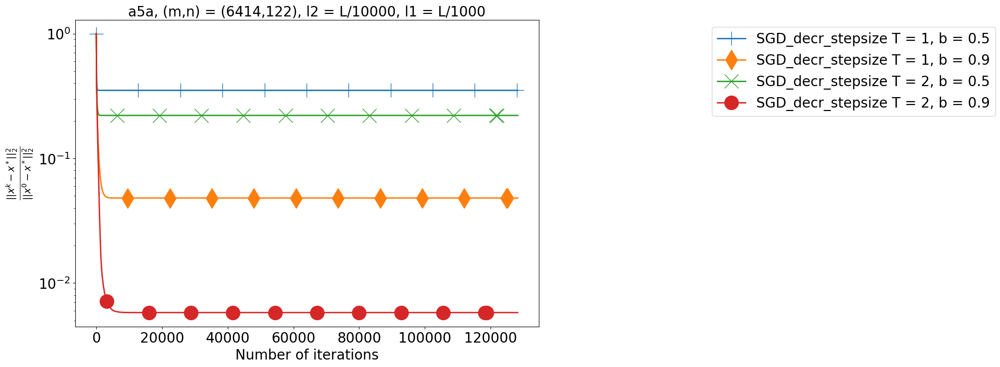

In [88]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

Результаты получились похожими на a9a. Различие в SGD const stepsize с batchsize = 100: стоит взять больше lr, так как сходится очень медленно при маленьком lr, показавшем лучший результат на датасете a9a. И заметно уменьшилась скорость сходимость в SGD decr stepsize с batchsize = 100.

Наилучшие параметры:
<br>
SGD const stepsize:
<br>
    batch size = 1 - gamma = 0.01/(L+l2)
<br>
    batch size = 10 - gamma = 0.1/(L+l2)
<br>
    batch size = 100 - gamma = 1/(L+l2)
<br>
SGD decr stepsize:
<br>
    batch size = 1 - T = 1, b = 0.5
<br>
    batch size = 10 - T = 2, b = 0.5
<br>
    batch size = 100 - T = 2, b = 0.9

### prox-GD

In [89]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
gamma = 1.0/((L+l2))
x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
S = 5000
save_info_period = 10

sparse = True

In [90]:
%%time
res = prox_gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 2.39 s, sys: 6.17 ms, total: 2.39 s
Wall time: 2.39 s


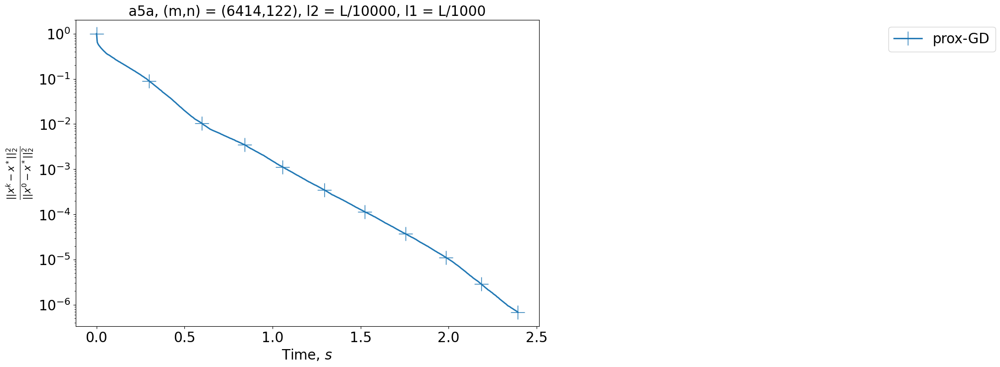

In [91]:
dataset = "a5a"
filename=dataset+"_x_init_all_ones"

methods = [
         ['prox-GD', [gamma, l2, l1, S], 
           '', None],
]
mode_y = 'squared_distances'
mode_x = 'time'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

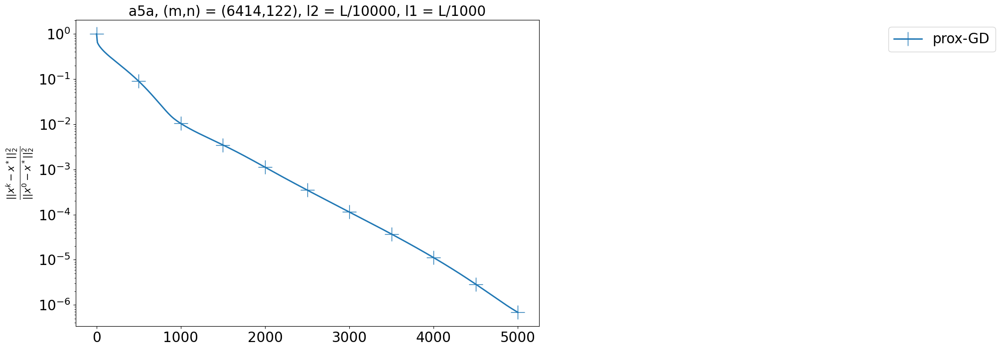

In [92]:
args_for_plots = [dataset, filename, mode_y, "data_passes", figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

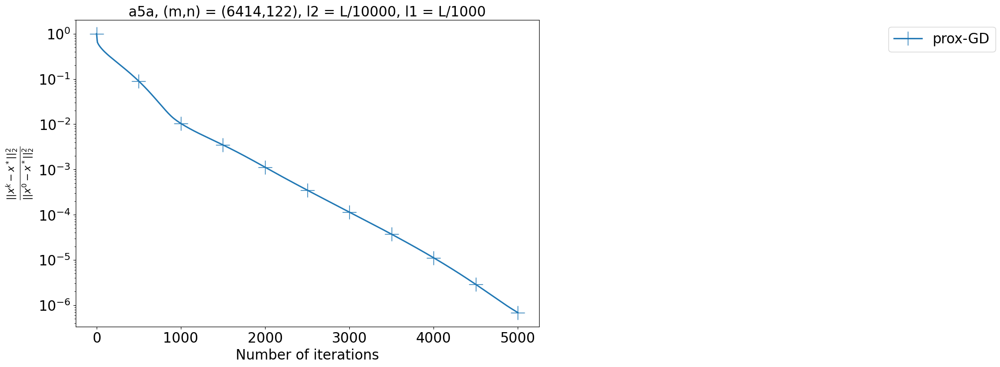

In [93]:
args_for_plots = [dataset, filename, mode_y, "iters", figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

### FISTA

In [94]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
S = 5000
save_info_period = 10

sparse = True

In [95]:
%%time
res = FISTA(filename=filename, x_init=x_init, A=A, y=y, L=L+l2, mu=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)

CPU times: user 3.65 s, sys: 22.8 ms, total: 3.68 s
Wall time: 3.71 s


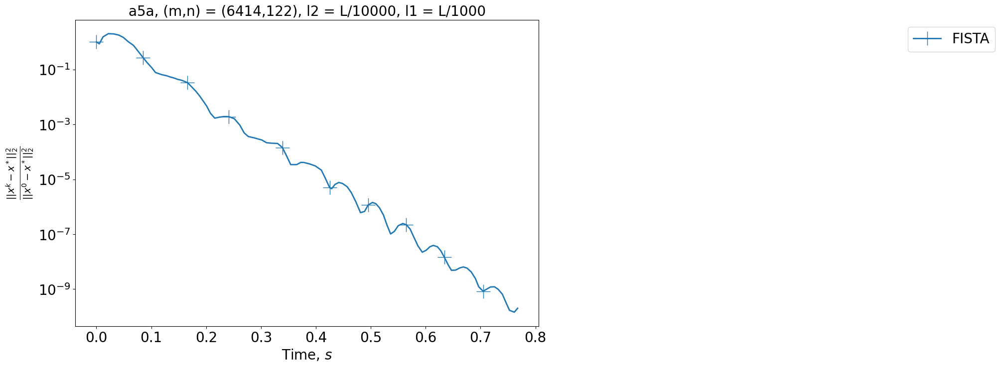

In [96]:
dataset = "a5a"
filename=dataset+"_x_init_all_ones"

methods = [
         ['FISTA', [l2, l1, S], 
           '', 5000],
]
mode_y = 'squared_distances'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)

args_for_plots = [dataset, filename, mode_y, mode_x, figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

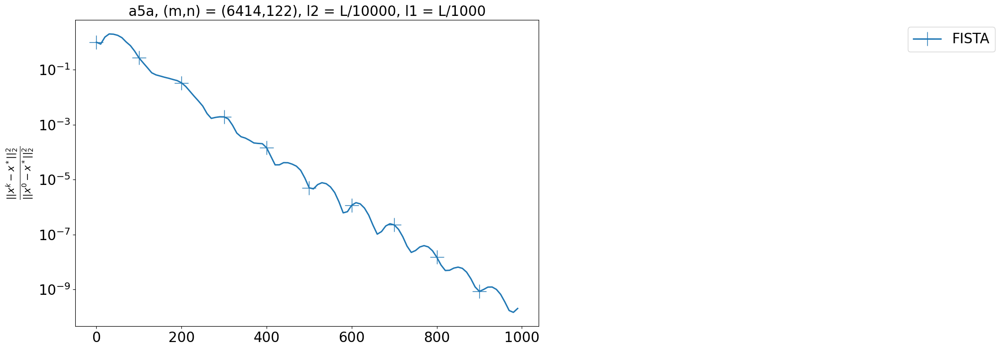

In [97]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

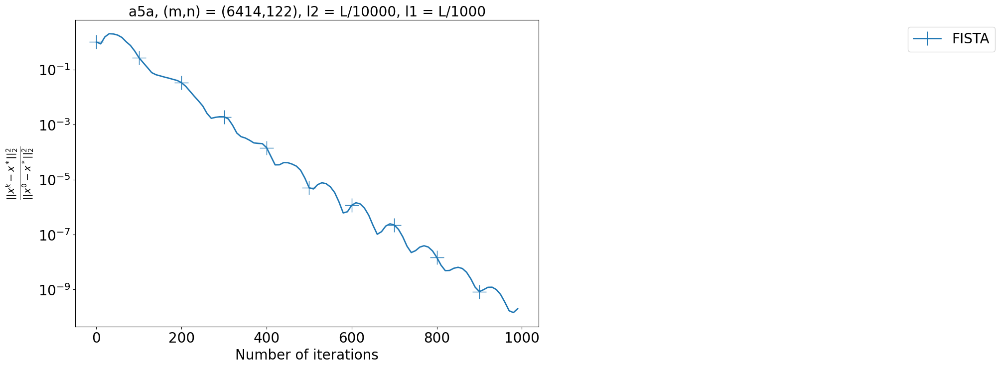

In [98]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

### GD

In [99]:
filename=dataset+"_x_init_all_ones"
x_init = np.ones(n)
l2 = L / 10000
l1 = L / 1000
x_star = read_solution(dataset, l2, l1)[0]
f_star = read_solution(dataset, l2, l1)[1]
S = 5000
save_info_period = 10

sparse = True

In [100]:
for a in 1, 0.1, 0.01:
    gamma = a/((L+l2))
    start = time.time()
    res = gd(filename=filename, x_init=x_init, A=A, y=y, gamma=gamma, l2=l2, 
     sparse=sparse, l1=l1, S=S, max_t=np.inf,
     save_info_period=save_info_period, 
     x_star=x_star, f_star=f_star)
    end = time.time()
    print(f"Gamma: {gamma}, время: {end - start}")
    print("Найденное значение: ", res['func_vals'][-1])
    print("Процент ненулевых координат в найденном решении: ", np.count_nonzero(res['last_iter'])/n)
    print()

Gamma: 0.6352495246047294, время: 2.692655086517334
Найденное значение:  5.9941306192801136e-05
Процент ненулевых координат в найденном решении:  1.0

Gamma: 0.06352495246047293, время: 3.280586004257202
Найденное значение:  0.03663392458149156
Процент ненулевых координат в найденном решении:  1.0

Gamma: 0.006352495246047293, время: 2.5749521255493164
Найденное значение:  0.19835716429114186
Процент ненулевых координат в найденном решении:  1.0



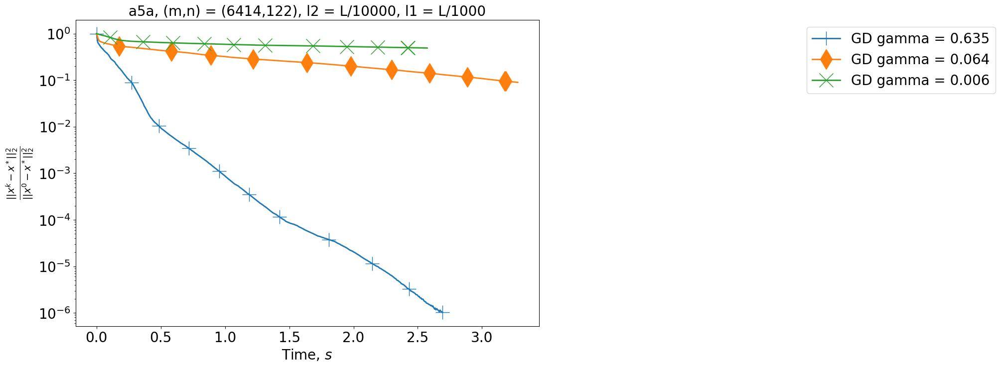

In [101]:
filename=dataset+"_x_init_all_ones"

methods = [
         ['GD', [1/((L+l2)), l2, l1, S], 
           f' gamma = {np.round(1/((L+l2)), 3)}', None],
         ['GD', [0.1/((L+l2)), l2, l1, S], 
           f' gamma = {np.round(0.1/((L+l2)), 3)}', None],
         ['GD', [0.01/((L+l2)), l2, l1, S], 
           f' gamma = {np.round(0.01/((L+l2)),3)}', None],
]
mode_y = 'squared_distances'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)

args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

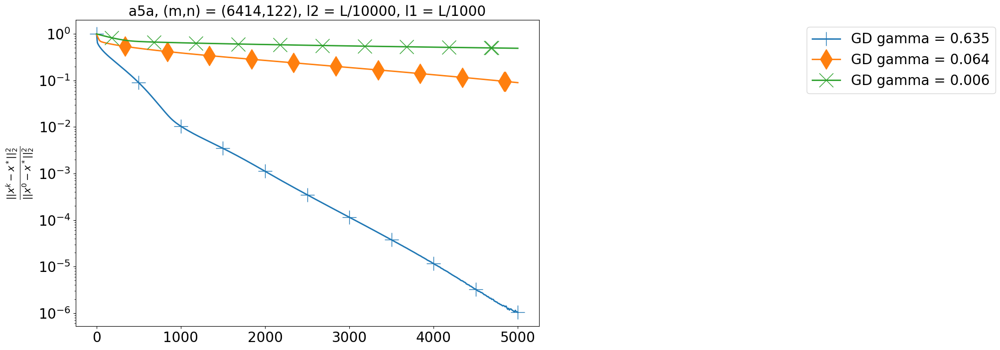

In [102]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

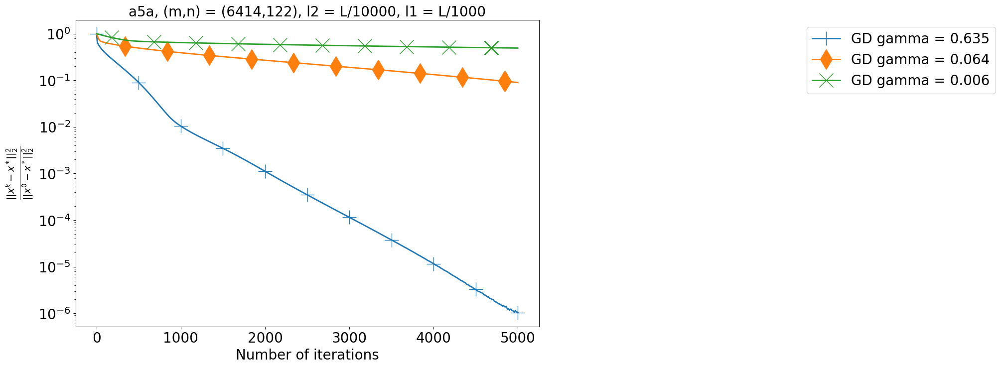

In [103]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

В данных методах изменений по сравнению с прошлым датасетом замечено не было. Ну и эти методы не стохастические.

## Сравнение методов

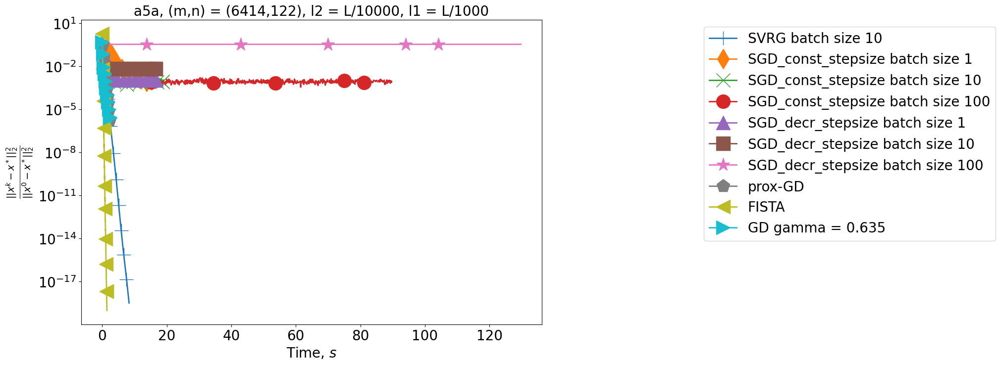

In [105]:
filename=dataset+"_x_init_all_ones"
l2 = L / 10000
l1 = L / 1000
lim = 3000
methods = [
    ['SVRG', [1.0/(6*(L+l2)), l2, l1, 800, int(2*m/10), 10], 
           ' batch size 10', 1000],
    ['SGD_const_stepsize', [0.01/(L+l2), l2, l1, 100, 1, int(2*m)], 
           f' batch size 1', lim],
    ['SGD_const_stepsize', [0.1/(L+l2), l2, l1, 800, 10, int(2*m/10)], 
           f' batch size 10', lim],
    ['SGD_const_stepsize', [1/(L+l2), l2, l1, 2000, 100, int(2*m/100)], 
           f' batch size 100', lim],
    ['SGD_decr_stepsize', [[1.0/(L+l2), 1, 0.5], l2, l1, 100, 1, int(2*m)], 
           f' batch size 1', lim],
    ['SGD_decr_stepsize', [[1.0/(L+l2), 2, 0.5], l2, l1, 800, 10, int(2*m) / 10], 
           f' batch size 10', lim],
    ['SGD_decr_stepsize', [[1.0/(L+l2), 2, 0.9], l2, l1, 2000, 100, int(2*m) / 100], 
           f' batch size 100', lim],
    ['prox-GD', [1.0/((L+l2)), l2, l1, 5000],  '', None],
    ['FISTA', [l2, l1, S], '', 200],
    ['GD', [1/((L+l2)), l2, l1, S], f' gamma = {np.round(1/((L+l2)), 3)}', None],
         
]
mode_y = 'squared_distances'
figsize = (12, 8)
fontsize = 20
if l1 != 0:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(int(L/l1))
else:
  title = dataset+", (m,n) = ("+str(m)+","+str(n)+"), l2 = L/"+str(int(L/l2))+", l1 = L/"+str(0)

args_for_plots = [dataset, filename, mode_y, 'time', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

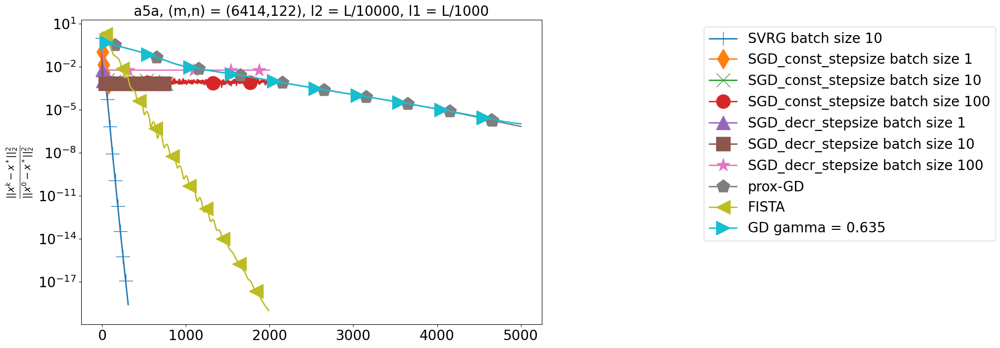

In [182]:
args_for_plots = [dataset, filename, mode_y, 'data_passes', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

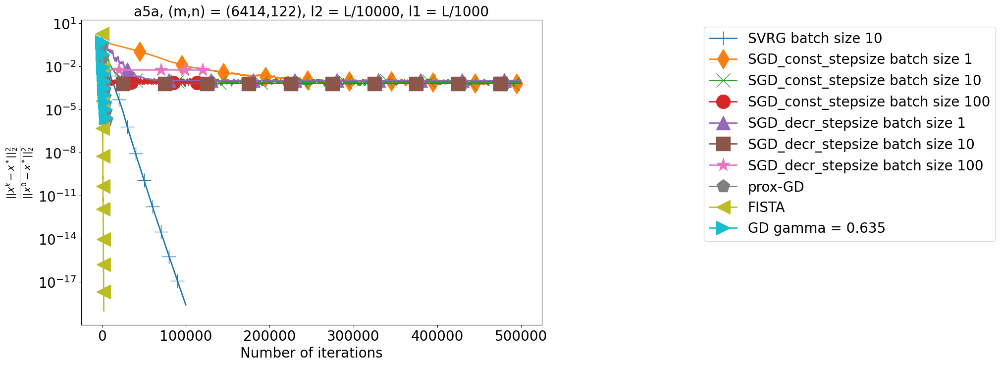

In [183]:
args_for_plots = [dataset, filename, mode_y, 'iters', figsize, fontsize, title, methods]
make_plots(args=args_for_plots)

В данном пункте также получились похожие результаты. Из замеченного: FISTA по времени лучше SVRG, что в прошлом датасете было не так.